Wes Stone
### Financial Applications of Quantum Computing: Mean-Variance Portfolio Optimization

**Mathematical Optimization** 

$$
\begin{aligned}
& \text{minimize} & & f_0(x) \\
& \text{subject to} & & f_i(x) \leq b_i, \quad i = 1, \dots, m
\end{aligned}
$$

- $x = (x_1, \dots, x_n)$: optimization variables
- $f_0: \mathbb{R}^n \rightarrow \mathbb{R}$: objective function
- $f_i: \mathbb{R}^n \rightarrow \mathbb{R}, \quad i = 1, \dots, m$: constraint functions

An optimal solution $x^\star$ has the smallest value of $f_0$ among all vectors that satisfy the constraints

Source: https://web.stanford.edu/~boyd/cvxbook/bv_cvxslides.pdf





**Factors contributing to difficulty of optimization include, but not limited to:**

1. High dimensionality
2. Constraints
3. Uncertainty
4. Multiple objectives
5. Complexity

Quantum computing has the potential to revolutiozie optimizaiton by exploiting quantum mechanics to solve problems more efficiently than classical computers.


In [4]:
import matplotlib
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt
import matplotx
import matplotlib.colors as mcolors
import tqdm
import seaborn as sns
import time
import datetime
import matplotlib.ticker as mtick
import datetime as dt
import panel as pn
import ipywidgets as widgets


#import api keys from keys.json
import json
with open('keys.json') as f:
    keys = json.load(f)
    ALPHA_VANTAGE_KEY = keys['ALPHA_VANTAGE_KEY']
    IBMQ_KEY = keys['IBMQ_KEY']
    f.close()


MAX_ITER = 300
RISK_FREE_RATE = 0.02 #Adjust to desired risk free rate

In [5]:
def get_daily_data(symbol, start_date, end_date):
    api_url = f'https://www.alphavantage.co/query?function=TIME_SERIES_DAILY_ADJUSTED&symbol={symbol}&outputsize=full&apikey={api_key}'
    raw_df = requests.get(api_url, timeout=100).json()
    df = pd.DataFrame(raw_df[f'Time Series (Daily)']).T
    df = df.rename(columns = {'5. adjusted close': 'adjusted close','7. dividend amount': 'dividend amount', '8. split coefficient': 'split coefficient'})
    df = df[['adjusted close', 'dividend amount', 'split coefficient']]
    for i in df.columns:
        df[i] = df[i].astype(float)
    df.index = pd.to_datetime(df.index)
    df = df.loc[start_date:end_date]
    return df


def get_adjusted_data(symbol, start_date, end_date):
    api_url = f'https://www.alphavantage.co/query?function=TIME_SERIES_DAILY_ADJUSTED&symbol={symbol}&outputsize=full&apikey={api_key}'
    raw_df = requests.get(api_url, timeout=100).json()
    if 'Time Series (Daily)' in raw_df:
        df = pd.DataFrame(raw_df[f'Time Series (Daily)']).T
    else:
        print(f'Error fetching data for {symbol}')
        return None
    df = df.rename(columns = {'5. adjusted close': 'adjusted close'})
    df = df[['adjusted close' ]]
    for i in df.columns:
        df[i] = df[i].astype(float)
    df.index = pd.to_datetime(df.index)
    df.sort_index(inplace=True)  
    df = df.loc[start_date:end_date]
    return df


def get_adj_close_df(stock_list, start_date, end_date):
    df = pd.DataFrame()
    for i in tqdm.tqdm(stock_list):
        temp_df = get_adjusted_data(i, start_date, end_date)
        if temp_df is not None:
            df[i] = temp_df['adjusted close']
            df.index.name = 'Date'
        else:
            print(f'Skipping {i} due to missing data')
        #time.sleep(15) <- this is to avoid hitting the API limit if needed
    return df

def get_cumulative_appreciation(df):
    df['stock price appreciation'] = (df['adjusted close'] - df['adjusted close'].iloc[0]) / df['adjusted close'].iloc[0]
    return df

def sum_dividends_till_date(df):
    df['dividend amount cumulative'] = df['dividend amount'].cumsum()
    return df

def total_return(df):
    df['total return'] = ((df['adjusted close'] - df['adjusted close'].iloc[0])+ df['dividend amount cumulative']) / df['adjusted close'].iloc[0]
    return df

def daily_returns(df):
    df['daily return'] = df['adjusted close'].pct_change()
    return df

In [6]:

output_text = widgets.Text()


def bind_input_to_output(change):
    output_text.value = change['new']

output_text = widgets.Text()
input_text = widgets.Text()

input_text.observe(bind_input_to_output, names='value')

instruction_label = widgets.Label(value="Format: MSFT,IBM,AAPL,...")

display(instruction_label)
display(input_text)


Label(value='Format: MSFT,IBM,AAPL,...')

Text(value='')

In [7]:

pn.extension()
date_range_slider = pn.widgets.DateRangeSlider(
    name='Date Range Slider',
    start=dt.datetime(2010, 1, 4), end=dt.datetime.now(),
    value=(dt.datetime(2018, 1, 2), dt.datetime.now()),
    width=900
    
    
)

date_range_slider

BokehModel(combine_events=True, render_bundle={'docs_json': {'8dc3fdb5-e35f-444d-b689-4b2c8eb096c5': {'version…

In [10]:
#make it check to see if date is a weekday... if not tweak it
api_key = ALPHA_VANTAGE_KEY
if len(output_text.value) < 1:
    stocks = ["XLY", "XLP", "XLE", "XLF", "XLV", "XLI", "XLB", "XRT", "XLK", "XLU"]
    # stocks = ['AAPL', 'MSFT', 'JPM', 'V', 'JNJ', 'PG', 'MA', 'T', 'HD', 'XOM', 
    #        'KO', 'DIS', 'UNH', 'CVX', 'WMT', 'BA', 'MMM', 'MRK', 'IBM', 'HON']#, 
#            'CSCO', 'INTC', 'VZ', 'PFE', 'AXP', 'CAT', 'NKE', 'MCD', 'CRM', 'GS']
    # stocks = ["AAPL", "MSFT", "AMZN", "GOOGL", "META", "JPM", 
    #                 "JNJ", "BRK-A", "V", "PG", "NVDA", "MA", 
    #                 "UNH", "HD", "PYPL", "BAC", "DIS", "VZ", "TSM", "T", "ATVI", 
    #                 "NFLX", "MRK", "PFE", "WMT", "BMY", "NKE", "CMCSA", "KO", "ADBE",
    #                 "CRM", "PEP", "CSCO", "XOM", "ABT", "TMO","MCD","ABBV","CVX",
    #                 "COST","NEE","TXN","AVGO","QCOM","PNC", "TJX", "DG", "STZ", 
    #                 "PM", "LOW", "SBUX", "INTC", "MDT", "UNP", "AMGN", "UPS",
    #                 "ORCL", "IBM", "LMT", "AMT", "HON", "BA", "MMM", "CAT", "GS"]
    # stocks = ['MSFT', 'AMZN']
    stocks =[
    "AAPL", "MSFT", "AMZN", "GOOGL", "GOOG", "META", "TSLA", "BRK-A", "BRK-B", "NVDA",
    "JPM", "JNJ", "V", "PG", "UNH", "MA", "INTC", "HD", "VZ", "DIS"] #, "BAC", "KO", "MRK"]
    # "XOM", "WMT", "PFE", "CSCO", "CMCSA", "BA", "CVX", "ADBE", "ORCL", "IBM", "CRM"]

    benchmark = 'SPY'

else:
    stocks = [x.strip().upper() for x in output_text.value.split(',')]

test_start = dt.datetime(2018, 1, 2) 
test_end = dt.datetime.now()

start_date = test_start.strftime('%Y-%m-%d')
end_date = test_end.strftime('%Y-%m-%d')

#Comment out if you want to use specific test dates
start_date = date_range_slider.value[0].strftime('%Y-%m-%d') 
end_date = date_range_slider.value[1].strftime('%Y-%m-%d')

start_date_str = date_range_slider.value[0].strftime('%A, %B %d, %Y')
end_date_str = date_range_slider.value[1].strftime('%A, %B %d, %Y')


stocks_str = ', '.join(stocks)
print(f"Stocks to be analyzed: {stocks_str} \nfrom {start_date_str} to {end_date_str}")
print(f'Benchmark: {benchmark}')
print(f'Stock list length: {len(stocks)}')


Stocks to be analyzed: AAPL, MSFT, AMZN, GOOGL, GOOG, META, TSLA, BRK-A, BRK-B, NVDA, JPM, JNJ, V, PG, UNH, MA, INTC, HD, VZ, DIS 
from Tuesday, January 02, 2018 to Thursday, December 07, 2023
Benchmark: SPY
Stock list length: 20


In [11]:
print("Stocks")
df = get_adj_close_df(stocks, start_date, end_date)
print("Benchmark")
df_benchmark = get_adj_close_df([benchmark], start_date, end_date)

df.head()

Stocks


100%|██████████| 20/20 [00:28<00:00,  1.43s/it]


Benchmark


100%|██████████| 1/1 [00:01<00:00,  1.35s/it]


,AAPL,MSFT,AMZN,GOOGL,GOOG,META,TSLA,BRK-A,BRK-B,NVDA,JPM,JNJ,V,PG,UNH,MA,INTC,HD,VZ,DIS
Date,,,,,,,,,,,,,,,,,,,,
2018-01-02,40.722078,80.210777,59.4505,53.6605,53.2500,181.42,21.368667,295755.01,197.22,49.312960,90.663677,118.410771,109.934537,77.098337,202.581831,146.974046,39.873991,162.575422,39.643637,108.716823
2018-01-03,40.714986,80.584067,60.2100,54.5760,54.1240,184.67,21.150000,299904.98,199.79,52.558438,90.756062,119.541895,111.028986,77.004781,204.706943,148.821985,38.520743,163.422755,38.828991,109.183585
2018-01-04,40.904105,81.293319,60.4795,54.7880,54.3200,184.33,20.974667,300516.00,200.69,52.835491,92.049458,119.533390,111.441804,77.549105,205.595460,150.747325,37.814331,164.719692,38.954891,109.134964
2018-01-05,41.369811,82.301203,61.4570,55.5145,55.1115,186.85,21.105333,301525.00,201.42,53.283228,91.458531,120.519934,114.110724,77.600135,209.515926,153.872374,38.078172,166.440296,38.866020,108.541787
2018-01-08,41.216152,82.385193,62.3435,55.7105,55.3470,188.28,22.427333,304180.00,202.74,54.915862,91.593600,120.673018,114.571545,78.008378,205.879419,154.336777,38.078172,166.042568,38.799367,106.985911


In [12]:
#print if any stocks contain NaN values
print(f"Stocks with NaN values: {df.columns[df.isna().any()].tolist()}")
#drop NaN values so it starts at earliest date with no NaN values
if len(df.columns[df.isna().any()].tolist()) > 0:
    df.dropna(axis=0, inplace=True)
    print(f'NaN values dropped. New stock list starts at {df.index[0]} and ends at {df.index[-1]}')
else: 
    print('No NaN values found, fine to proceed')

df_benchmark = df_benchmark.loc[df.index[0]:df.index[-1]]
print(f'Benchmark starts at {df_benchmark.index[0]} and ends at {df_benchmark.index[-1]}')

Stocks with NaN values: []
No NaN values found, fine to proceed
Benchmark starts at 2018-01-02 00:00:00 and ends at 2023-12-07 00:00:00


100%|██████████| 20/20 [00:00<00:00, 460.19it/s]


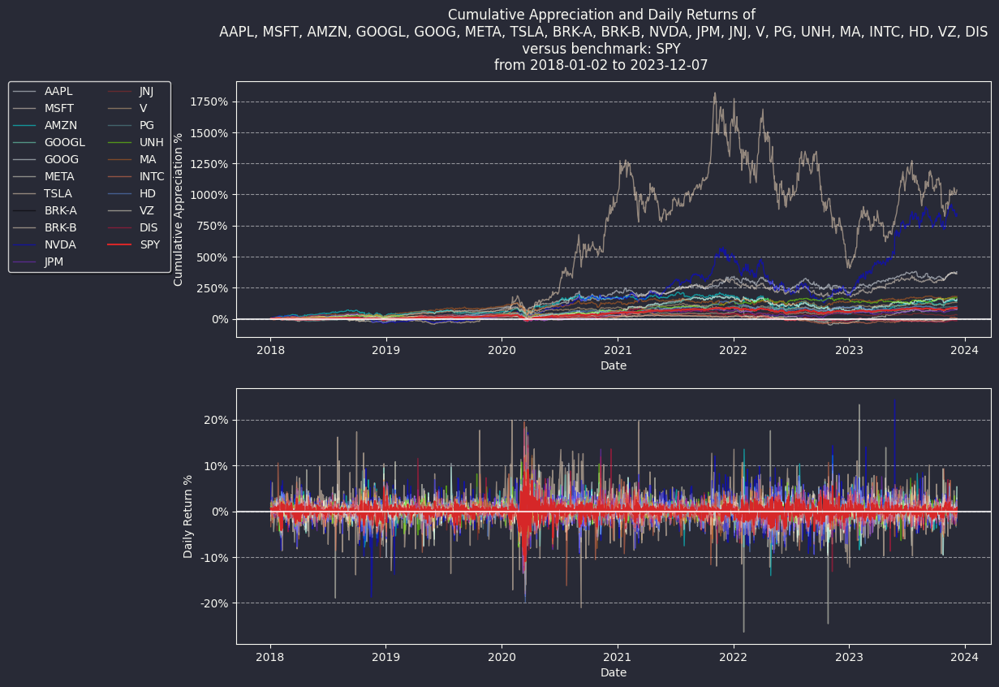

In [13]:


plt.style.use(matplotx.styles.dracula)
fig, axes = plt.subplots(nrows=2, figsize=(12, 9))

stock_cum_appreciation = pd.DataFrame(index=df.index)
stocks_daily_returns = pd.DataFrame(index=df.index)

colors = list(mcolors.CSS4_COLORS)
for i in tqdm.tqdm(df.columns):
    try: 
        adj_data_df = pd.DataFrame(df[i])
        adj_data_df = adj_data_df.rename(columns = {i: 'adjusted close'})
        adj_data_df = adj_data_df.loc[df.index[0]:df.index[-1]]
        plot_df = get_cumulative_appreciation(adj_data_df)
        stock_cum_appreciation[i] = plot_df['stock price appreciation']
        return_df = daily_returns(plot_df)
        stocks_daily_returns[i] = return_df['daily return']
        axes[0].plot(plot_df['stock price appreciation'], label = i, linewidth=1, alpha=.5, c = colors[df.columns.get_loc(i)])
        axes[1].plot(return_df['daily return'], label = i, linewidth=1, alpha=.5, c = colors[df.columns.get_loc(i)])
        axes[0].yaxis.set_major_formatter('{x:.0%}')
        axes[1].yaxis.set_major_formatter('{x:.0%}')
    except:
        print(f'Error with {i}')

#plot benchmark
plot_df = get_cumulative_appreciation(get_adjusted_data(benchmark, start_date, end_date).loc[df.index[0]:df.index[-1]])
stock_cum_appreciation[benchmark] = plot_df['stock price appreciation']
return_df = daily_returns(plot_df)
stocks_daily_returns[benchmark] = return_df['daily return']
axes[0].plot(plot_df['stock price appreciation'], label = benchmark, linewidth=1.5, alpha=1, c = 'tab:red')
axes[1].plot(return_df['daily return'], label = benchmark, linewidth=1.5, alpha=1, c = 'tab:red')
axes[0].yaxis.set_major_formatter('{x:.0%}')
axes[1].yaxis.set_major_formatter('{x:.0%}')



axes[0].set_xlabel('Date')
axes[0].set_ylabel('Cumulative Appreciation %')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Daily Return %')

axes[0].axhline(y=0, color='white', linestyle='-', alpha=.8)
axes[1].axhline(y=0, color='white', linestyle='-', alpha=.8)

axes[0].grid(which='major', axis='y', linestyle='--', c = 'white', alpha = 0.5)
axes[1].grid( which='major', axis='y', linestyle='--', c = 'white', alpha = 0.5)

if len(df.columns) > 30:
    stocks_str = 'Stocks'
axes[0].xaxis.grid(False)
# axes[0].yaxis.grid(False)

axes[1].xaxis.grid(False)
# axes[1].yaxis.grid(False)
    
plt.suptitle(f'Cumulative Appreciation and Daily Returns of\n {stocks_str}\n versus benchmark: {benchmark} \nfrom {start_date} to {end_date}')
plt.legend(loc='upper left', ncol=2, shadow=True, fancybox=True, bbox_to_anchor=(-.31, 2.22), fontsize =10)  # Adjust the legend settings

plt.show()


In [14]:
if len(df.columns) <= 30: 
    sns.set(style="ticks", font_scale=3)
    plt.style.use(matplotx.styles.dracula)
    g = sns.pairplot(stocks_daily_returns, height=5, diag_kind='kde', diag_kws={'bw_adjust':0.2}, corner=True, kind='reg')
    g.map_upper(sns.regplot, scatter_kws={'s': 10}, line_kws={'color':'red'})
    plt.show()
else:
    print('Takes too long')



In [17]:
import pypfopt
pypfopt.__version__

'1.5.5'

In [18]:

from pypfopt.expected_returns import mean_historical_return
from pypfopt.risk_models import *
from pypfopt import expected_returns

import plotting

Covariance in daily vs period returns 
pyportopt uses daily returns 
qiskit uses period returns

lead to different results

In [19]:
mean_historical_return(df_benchmark)


SPY    0.112326
dtype: float64

In [20]:
(1+mean_historical_return(df_benchmark))**(1/252)-1

SPY    0.000423
dtype: float64

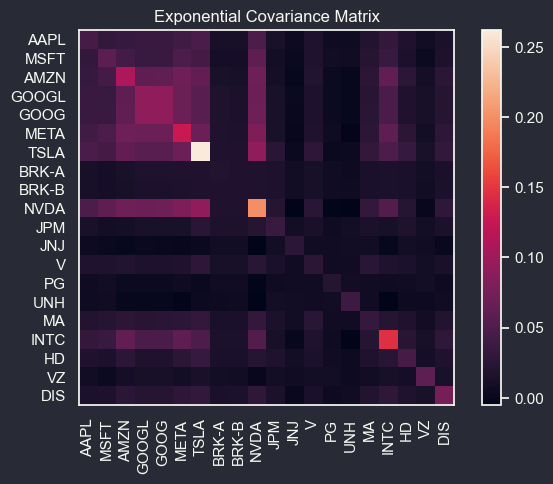

In [42]:
sns.set(font_scale=1)
plt.style.use(matplotx.styles.dracula)
mu_mean_hist = mean_historical_return(df)
mu_capm_return = expected_returns.capm_return(df, df_benchmark, risk_free_rate=RISK_FREE_RATE)
ema_historical_return = expected_returns.ema_historical_return(df)

frequency = 252 #252 trading days in a year, annualizes covariances. Default 

benchmark_returns_semi = (1+mean_historical_return(df_benchmark))**(1/252)-1
#Shrinkage or Exp Covariance likely to be best
cov_matrix_shrinkage = CovarianceShrinkage(df, frequency = frequency).ledoit_wolf() #Ledoit-Wolf shrinkage, which reduces the extreme values in the covariance matrix.
cov_sample_cov = sample_cov(df)
cov_exp_cov = exp_cov(df)
# semi_cov = semicovariance(df, benchmark = benchmark_returns_semi)
# #drop row and column of benchmark
# semi_cov = semi_cov.iloc[:-1,:-1]
oracle_approx = CovarianceShrinkage(df, frequency = frequency).oracle_approximating()

plt.rcParams['axes.grid'] = False


plotting.plot_covariance(cov_exp_cov, plot_correlation=False)
plt.title('Exponential Covariance Matrix')
plt.show()


In [43]:
past_returns, future_returns = df.iloc[:int(len(df)/2)], df.iloc[int(len(df)/2):]
future_cov = sample_cov(future_returns)
print(f'PAST RETURNS FROM {past_returns.index[0]} TO {past_returns.index[-1]}')
print(f'FUTURE RETURNS FROM {future_returns.index[0]} TO {future_returns.index[-1]}')

PAST RETURNS FROM 2018-01-02 00:00:00 TO 2020-12-17 00:00:00
FUTURE RETURNS FROM 2020-12-18 00:00:00 TO 2023-12-07 00:00:00


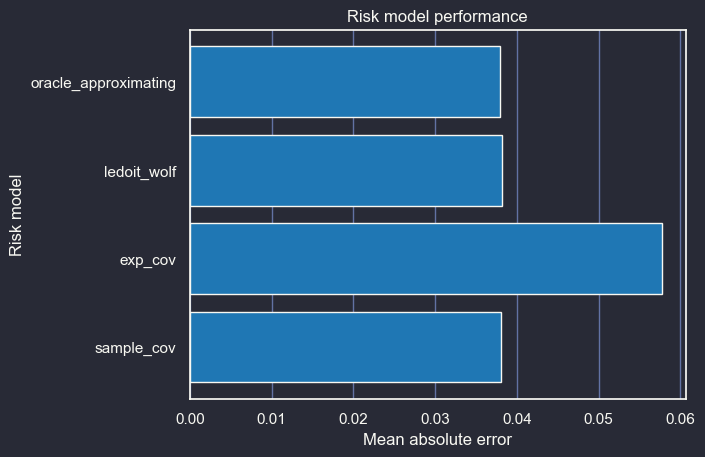

In [44]:
future_variance = np.diag(future_cov)
mean_abs_errors = []

plt.style.use(matplotx.styles.dracula)
risk_methods  = [
    "sample_cov",
    "exp_cov",
    "ledoit_wolf", 
    "oracle_approximating"]

from sklearn.metrics import r2_score
for method in risk_methods:
    S = risk_matrix(past_returns, method=method)
    variance = np.diag(S)
    mean_abs_errors.append(np.sum(np.abs(variance - future_variance)) / len(variance))

dict_mae_risk = dict(zip(risk_methods, mean_abs_errors))


fig, ax = plt.subplots()

xrange = range(len(mean_abs_errors))
ax.barh(xrange, mean_abs_errors, color='tab:blue')

ax.yaxis.grid(False)  
ax.xaxis.grid(True)  

ax.set_yticks(xrange)
ax.set_yticklabels(risk_methods)
ax.set_xlabel("Mean absolute error")
ax.set_ylabel("Risk model")
ax.set_title("Risk model performance")

plt.show()

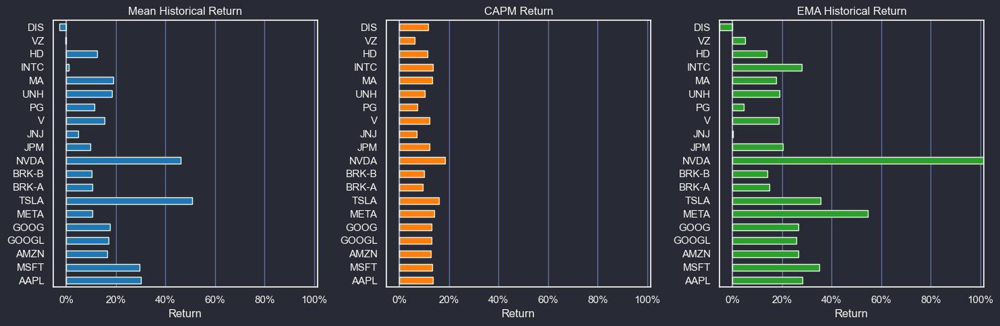

In [45]:
import matplotlib.pyplot as plt
import pandas as pd

fig, axes = plt.subplots(1, 3, figsize=(15, 5))

mu_mean_hist.plot(kind='barh', ax=axes[0], title='Mean Historical Return', color='tab:blue')
mu_capm_return.plot(kind='barh', ax=axes[1], title='CAPM Return', color='tab:orange')
ema_historical_return.plot(kind='barh', ax=axes[2], title='EMA Historical Return', color='tab:green')


max = np.max([mu_mean_hist.max(), mu_capm_return.max(), ema_historical_return.max()])
min = np.min([mu_mean_hist.min(), mu_capm_return.min(), ema_historical_return.min()])

for ax in axes:
    ax.set_xlabel('Return')
    ax.set_xlim(min, max)
    ax.xaxis.set_major_formatter('{x:.0%}')
    ax.axvline(x=0, color='white', linestyle='-', alpha=.5)
    ax.yaxis.grid(False)
    ax.xaxis.grid(True)


plt.tight_layout()
plt.show()


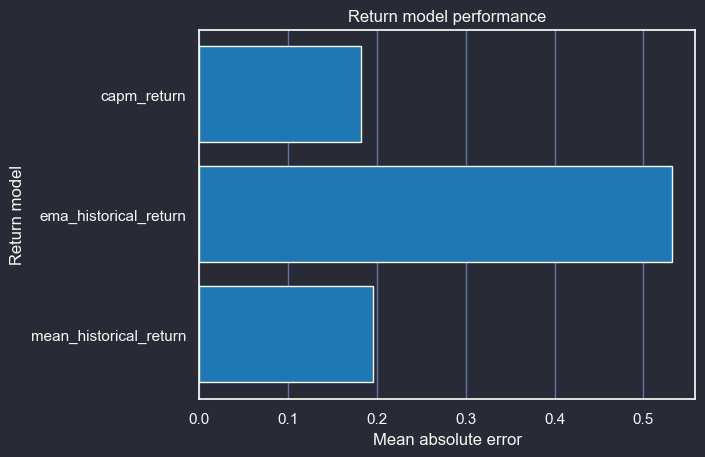

In [46]:
future_rets = expected_returns.mean_historical_return(future_returns)
mean_abs_errors_returns = []
return_methods = [
    "mean_historical_return",
    "ema_historical_return",
    "capm_return",
    ]

for method in return_methods:
    mu = expected_returns.return_model(past_returns, method=method)
    mean_abs_errors_returns.append(np.sum(np.abs(mu - future_rets)) / len(mu))

dict_mu_mae = dict(zip(return_methods, mean_abs_errors_returns))
    
fig, ax = plt.subplots()

xrange = range(len(mean_abs_errors_returns))
ax.barh(xrange, mean_abs_errors_returns, color='tab:blue')

ax.yaxis.grid(False)  
ax.xaxis.grid(True)  

ax.set_yticks(xrange)
ax.set_yticklabels(return_methods)
ax.set_xlabel("Mean absolute error")
ax.set_ylabel("Return model")
ax.set_title("Return model performance")

plt.show()

In [47]:
mu = __builtins__.min(dict_mu_mae, key=dict_mu_mae.get)
min_value = dict_mu_mae[mu]

print(f'{mu} selected, MAE {min_value:.4f}')

S = __builtins__.min(dict_mae_risk, key=dict_mae_risk.get)
min_value = dict_mae_risk[S]
print(f'{S} selected, MAE {min_value:.4f}')

capm_return selected, MAE 0.1820
oracle_approximating selected, MAE 0.0380


In [48]:
if mu == 'mean_historical_return':
    returns = mu_mean_hist
elif mu == 'ema_historical_return':
    returns = ema_historical_return
elif mu == 'capm_return':
    returns = mu_capm_return

if S == 'sample_cov':
    cov_matrix = cov_sample_cov
elif S == 'oracle_approximating':
    cov_matrix = oracle_approx
elif S == 'exp_cov':
    cov_matrix = cov_exp_cov
elif S == 'ledoit_wolf':
    cov_matrix = cov_matrix_shrinkage


In [49]:
cov_matrix

,AAPL,MSFT,AMZN,GOOGL,GOOG,META,TSLA,BRK-A,BRK-B,NVDA,JPM,JNJ,V,PG,UNH,MA,INTC,HD,VZ,DIS
AAPL,0.101172,0.071930,0.070264,0.067146,0.067112,0.077889,0.094239,0.036913,0.039799,0.104197,0.044688,0.025184,0.055134,0.027589,0.041894,0.062626,0.067750,0.049878,0.017848,0.047223
MSFT,0.071930,0.091493,0.074483,0.072545,0.072223,0.078835,0.085882,0.035060,0.038276,0.108012,0.043060,0.025681,0.056081,0.028384,0.043186,0.063416,0.068535,0.050641,0.018228,0.047821
AMZN,0.070264,0.074483,0.125909,0.074365,0.074842,0.092055,0.095865,0.029309,0.031089,0.110728,0.033248,0.017208,0.047699,0.018306,0.030393,0.055966,0.061662,0.045533,0.013290,0.047473
GOOGL,0.067146,0.072545,0.074365,0.098217,0.097321,0.089198,0.079851,0.034942,0.037452,0.101953,0.043509,0.022437,0.052941,0.022920,0.037828,0.060172,0.064194,0.045813,0.017366,0.049204
GOOG,0.067112,0.072223,0.074842,0.097321,0.098194,0.089204,0.079692,0.035052,0.037553,0.101423,0.043516,0.022156,0.052766,0.022788,0.037698,0.060144,0.063626,0.045783,0.017273,0.049437
META,0.077889,0.078835,0.092055,0.089198,0.089204,0.183829,0.093254,0.034779,0.037146,0.120024,0.043955,0.020403,0.056710,0.022017,0.032920,0.066808,0.074529,0.053389,0.016668,0.055129
TSLA,0.094239,0.085882,0.095865,0.079851,0.079692,0.093254,0.408050,0.038382,0.039814,0.154457,0.053678,0.015451,0.064843,0.017739,0.039263,0.071866,0.083784,0.059086,0.009771,0.063159
BRK-A,0.036913,0.035060,0.029309,0.034942,0.035052,0.034779,0.038382,0.045909,0.045663,0.047207,0.049095,0.022902,0.038709,0.020823,0.033116,0.042171,0.038730,0.034406,0.019054,0.038513
BRK-B,0.039799,0.038276,0.031089,0.037452,0.037553,0.037146,0.039814,0.045663,0.048636,0.050932,0.052484,0.024146,0.040958,0.022881,0.035260,0.044919,0.043247,0.036958,0.020430,0.041404
NVDA,0.104197,0.108012,0.110728,0.101953,0.101423,0.120024,0.154457,0.047207,0.050932,0.265267,0.060341,0.024607,0.077952,0.028291,0.051584,0.088090,0.107663,0.072924,0.014869,0.067459


c:\Users\wesst\.virtualenvs\qiskit_finance_capstone-tJsEZMkD\Lib\site-packages\cvxpy\reductions\solvers\solving_chain.py:336: FutureWarning: 
    Your problem is being solved with the ECOS solver by default. Starting in 
    CVXPY 1.5.0, Clarabel will be used as the default solver instead. To continue 
    using ECOS, specify the ECOS solver explicitly using the ``solver=cp.ECOS`` 
    argument to the ``problem.solve`` method.
    
  warnings.warn(ECOS_DEPRECATION_MSG, FutureWarning)


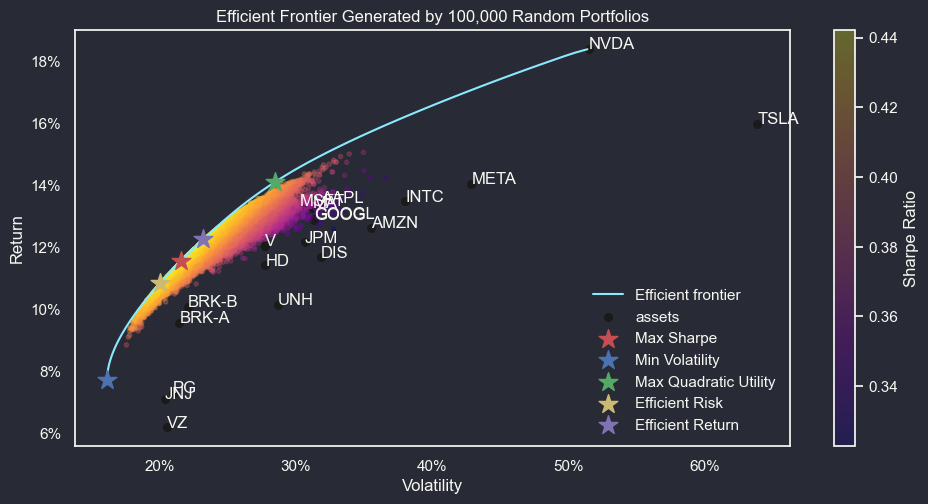

Weights for:,Max Sharpe,Min Volatility,Max Quadratic Utility,Efficient Risk,Efficient Return
Stock Ticker,,,,,
AAPL,0.08097,0.00000,0.13652,0.06488,0.09754
MSFT,0.07079,0.00000,0.12671,0.05180,0.09117
AMZN,0.04411,0.06491,0.00000,0.05230,0.03522
GOOGL,0.05186,0.00000,0.01546,0.04888,0.05469
GOOG,0.00000,0.00000,0.00000,0.00000,0.00000
META,0.01842,0.00000,0.03779,0.01632,0.02046
TSLA,0.01808,0.00627,0.03086,0.01789,0.01808
BRK-A,0.04138,0.17757,0.00000,0.11298,0.00000
BRK-B,0.08255,0.00000,0.00000,0.02694,0.10872


In [50]:
from pypfopt.efficient_frontier import EfficientFrontier
import copy


mu = returns
S = cov_matrix

ef = EfficientFrontier(returns, cov_matrix, weight_bounds=(0, 1))
fig, ax = plt.subplots(figsize=(10, 5))

ef_max_sharpe = copy.deepcopy(ef) 
ef_min_vol = copy.deepcopy(ef)
ef_max_quad_util = copy.deepcopy(ef)
ef_efficient_risk = copy.deepcopy(ef)
ef_efficient_return = copy.deepcopy(ef)


plotting.plot_efficient_frontier(ef, ax=ax, show_tickers=True)

#=============ADJUST PORTFOLIO PARAMETERS HERE==================

#MAX SHARPE
ef_max_sharpe.max_sharpe(risk_free_rate=RISK_FREE_RATE) 
ret_tangent, std_tangent, _ = ef_max_sharpe.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="r", label="Max Sharpe", zorder=3)

#MIN VOLATILITY
ef_min_vol.min_volatility()
ret_tangent, std_tangent, _ = ef_min_vol.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="b", label="Min Volatility", zorder=3)

#MAX QUAD UTIL
ef_max_quad_util.max_quadratic_utility()
ret_tangent, std_tangent, _ = ef_max_quad_util.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="g", label="Max Quadratic Utility", zorder=3)

#EFFICIENT RISK
ef_efficient_risk.efficient_risk(.2) #FIX THIS
ret_tangent, std_tangent, _ = ef_efficient_risk.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="y", label="Efficient Risk", zorder=3)

#EFFICIENT RETURN
ef_efficient_return.efficient_return(mu_capm_return.max()/1.5) #FIX THIS
ret_tangent, std_tangent, _ = ef_efficient_return.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="m", label="Efficient Return", zorder=3)

#===============================================================

n_samples = 100000
w = np.random.dirichlet(np.ones(ef.n_assets), n_samples)
rets = w.dot(mu)
stds = stds = np.sqrt((w.T * (S @ w.T)).sum(axis=0))
sharpes = (rets- RISK_FREE_RATE) / stds
df_portfolios = pd.DataFrame({'Returns': rets, 'Volatility': stds, 'Sharpe Ratio': sharpes})

sc = ax.scatter(stds, rets, marker=".", c=sharpes, cmap="plasma", alpha=0.3)
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Sharpe Ratio')


ax.set_title(f"Efficient Frontier Generated by {n_samples:,} Random Portfolios")
ax.legend()


ax.xaxis.set_major_formatter('{x:.0%}')
ax.yaxis.set_major_formatter('{x:.0%}')

ax.xaxis.grid(False)
ax.yaxis.grid(False)

df_weights = pd.DataFrame(index=ef.tickers)

df_weights['Max Sharpe'] = ef_max_sharpe.clean_weights()
df_weights['Min Volatility'] = ef_min_vol.clean_weights()
df_weights['Max Quadratic Utility'] = ef_max_quad_util.clean_weights()
df_weights['Efficient Risk'] = ef_efficient_risk.clean_weights()
df_weights['Efficient Return'] = ef_efficient_return.clean_weights()

df_weights.index.name = 'Stock Ticker'
df_weights.columns.name = 'Weights for:'

plt.show()
df_weights

In [51]:
cov_matrix.shape, returns.shape

((20, 20), (20,))

In [52]:
from pypfopt.efficient_frontier import EfficientFrontier
import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt



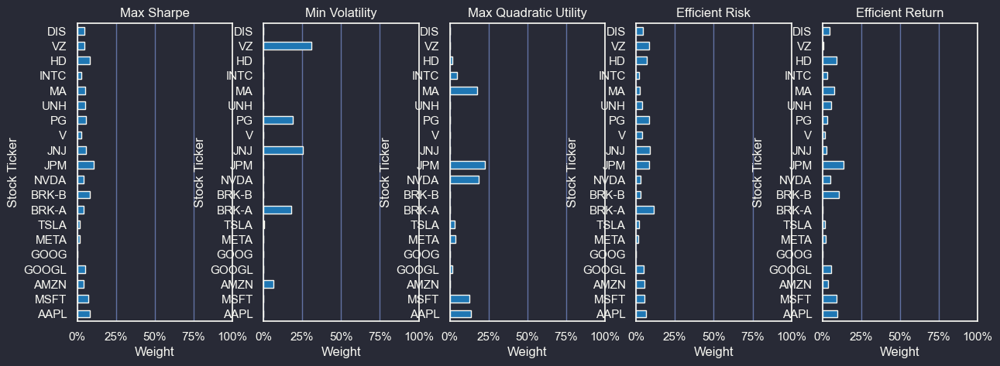

In [53]:
plt.style.use(matplotx.styles.dracula)

fig, axes = plt.subplots(1, 5, figsize=(15, 5))
for i, ax in enumerate(axes):
    df_weights.iloc[:,i].plot(kind='barh', ax=ax, title=df_weights.columns[i], color='tab:blue')
    ax.set_xlabel('Weight')
    ax.set_xlim(0, 1)
    ax.xaxis.set_major_formatter('{x:.0%}')

    ax.xaxis.grid(True)

    
    ax.yaxis.grid(False)
    

In [54]:
portfolio_list = [ef_min_vol, ef_max_sharpe, ef_max_quad_util, ef_efficient_risk, ef_efficient_return]

port_returns = [ef.portfolio_performance()[0] for ef in portfolio_list]
volatility = [ef.portfolio_performance()[1] for ef in portfolio_list]
sharpe = [ef.portfolio_performance()[2] for ef in portfolio_list]

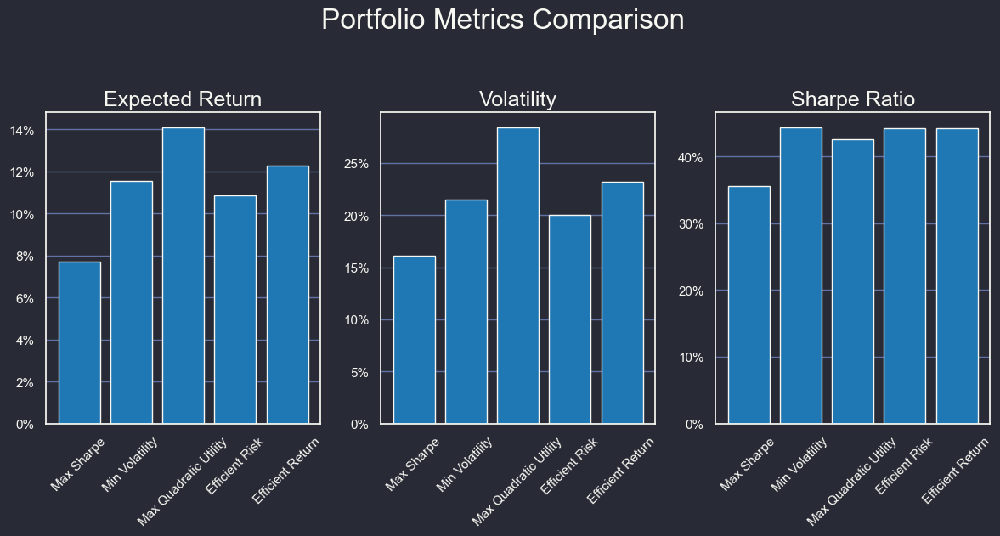

In [55]:
import matplotlib.pyplot as plt
sns.set_style('darkgrid')
plt.style.use(matplotx.styles.dracula)

fig, axes = plt.subplots(1, 3, figsize=(12, 6))

colors = plt.cm.Pastel1(range(len(df_weights.columns)))

titles = ['Expected Return', 'Volatility', 'Sharpe Ratio']
metrics = [port_returns, volatility, sharpe]

for i, (ax, title, metric) in enumerate(zip(axes, titles, metrics)):
    ax.bar(df_weights.columns, metric, color='tab:blue')
    ax.set_title(title, fontsize=18)
    ax.set_xlabel('')
    ax.tick_params(axis='x', rotation=45)
    ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: '{:.0%}'.format(x)))

    ax.yaxis.grid(True)
    ax.xaxis.grid(False)

fig.suptitle('Portfolio Metrics Comparison', fontsize=24, y=1.05)

fig.tight_layout()

plt.show()


In [56]:
from pypfopt.discrete_allocation import DiscreteAllocation

starting_capital = 10_000
portfolio_dicts = {}
for i in range(5):
    portfolio = df_weights.iloc[:,i]
    portfolio = portfolio[portfolio != 0]
    portfolio = portfolio.to_dict()
    portfolio_dicts[df_weights.columns[i]] = portfolio

earliest_prices = []    
for i in df_weights.index:
    earliest_price = df[i][0]
    earliest_prices.append(earliest_price)


earliest_prices = pd.Series(earliest_prices, index=df_weights.index)


C:\Users\wesst\AppData\Local\Temp\ipykernel_23400\2526063922.py:13: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  earliest_price = df[i][0]


In [57]:
discrete_allocation = {}
for key, value in portfolio_dicts.items():
    discrete_allocation[key] = DiscreteAllocation(value, earliest_prices, total_portfolio_value=starting_capital).greedy_portfolio()

In [58]:
rows = set()
columns = discrete_allocation.keys()

for col, (nested_dict, _) in discrete_allocation.items():
    rows.update(nested_dict.keys())

df_discrete_allocation = pd.DataFrame(index=sorted(rows), columns=columns)

for col, (nested_dict, capital) in discrete_allocation.items():
    for row, value in nested_dict.items():
        df_discrete_allocation.at[row, col] = value
    df_discrete_allocation.at['Remaining Capital', col] = capital

df_discrete_allocation.fillna(0, inplace=True)
df_discrete_allocation

,Max Sharpe,Min Volatility,Max Quadratic Utility,Efficient Risk,Efficient Return
AAPL,19.000000,0.000000,33.000000,15.00000,23.00000
AMZN,7.000000,10.000000,0.000000,8.00000,6.00000
BRK-B,5.000000,0.000000,0.000000,2.00000,6.00000
DIS,4.000000,1.000000,0.000000,4.00000,4.00000
GOOGL,10.000000,0.000000,3.000000,9.00000,10.00000
HD,5.000000,0.000000,1.000000,4.00000,6.00000
INTC,7.000000,0.000000,12.000000,5.00000,8.00000
JNJ,5.000000,21.000000,0.000000,7.00000,2.00000
JPM,12.000000,0.000000,25.000000,9.00000,15.00000
MA,4.000000,0.000000,12.000000,2.00000,5.00000


In [59]:
def simple_backtest(df, discrete_allocation_dict, strategy):
    columns = list(discrete_allocation_dict[strategy][0].keys())
    df = df[columns].copy() 

    shares = list(discrete_allocation_dict[strategy][0].values())

    for i in range(len(columns)):
        df.loc[:, columns[i]] = df[columns[i]] * shares[i]

    df[strategy] = df.sum(axis=1)
    df = df[[strategy]]
    df[f'Cumulative Appreciation: {strategy}'] = (df[strategy] - df[strategy].iloc[0]) / df[strategy].iloc[0]

    return df

strategies = pd.DataFrame(index = df.index)
for strategy in discrete_allocation.keys():
    strategies[strategy] = simple_backtest(df, discrete_allocation, strategy)[f'Cumulative Appreciation: {strategy}']

strategies
    


,Max Sharpe,Min Volatility,Max Quadratic Utility,Efficient Risk,Efficient Return
Date,,,,,
2018-01-02,0.000000,0.000000,0.000000,0.000000,0.000000
2018-01-03,0.006861,-0.004225,0.014441,0.005029,0.008321
2018-01-04,0.012163,-0.001196,0.021832,0.009739,0.014210
2018-01-05,0.020230,0.001803,0.030353,0.017261,0.022560
2018-01-08,0.023036,0.004132,0.039239,0.020017,0.025546
...,...,...,...,...,...
2023-12-01,1.804890,0.498006,3.421917,1.613469,2.019736
2023-12-04,1.777649,0.488460,3.347636,1.588336,1.989259
2023-12-05,1.797531,0.479201,3.411016,1.604833,2.014911


In [60]:
benchmark_plot = pd.DataFrame(stock_cum_appreciation['SPY'])
benchmark_plot

,SPY
Date,
2018-01-02,0.000000
2018-01-03,0.006325
2018-01-04,0.010567
2018-01-05,0.017301
2018-01-08,0.019161
...,...
2023-12-01,0.882481
2023-12-04,0.872599
2023-12-05,0.872230


In [61]:
benchmark_plot.iloc[-1, 0]

0.8789134442542547

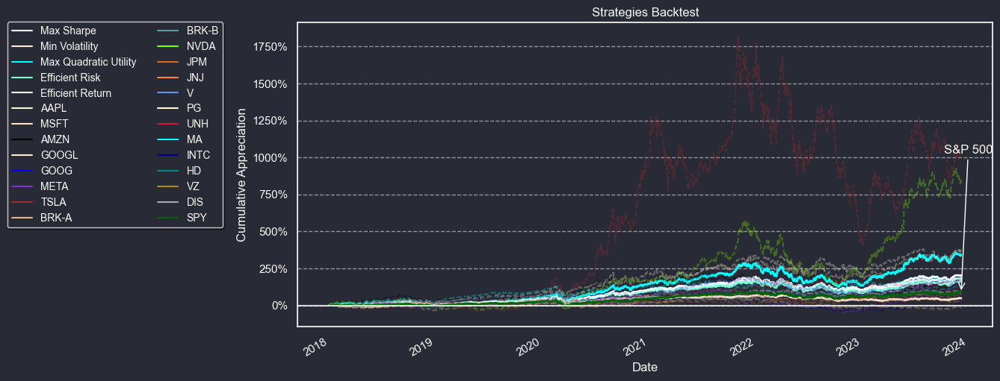

In [62]:
strategies_and_stocks = pd.concat([strategies, stock_cum_appreciation], axis=1)


colors = list(mcolors.CSS4_COLORS)
plt.style.use(matplotx.styles.dracula)
fig, ax = plt.subplots(figsize=(12, 6))
strategies_and_stocks.plot(ax=ax, title='Strategies Backtest', color=colors)
ax.set_ylabel('Cumulative Appreciation')
ax.set_xlabel('Date')
ax.legend(loc='upper left', ncol = 2, shadow=True, fancybox=True, bbox_to_anchor=(-.425, 1.02), fontsize=10)


ax.yaxis.set_major_formatter('{x:.0%}')

for i in range(0,5):
    ax.lines[i].set_linewidth(2)
    ax.lines[i].set_alpha(1)
for i in range(5,len(strategies_and_stocks.columns)-1):
    ax.lines[i].set_alpha(0.3)
    ax.lines[i].set_linestyle('dashed')
ax.lines[len(strategies_and_stocks.columns)-1].set_linewidth(2)
ax.lines[len(strategies_and_stocks.columns)-1].set_alpha(1)

ax.axhline(y=0, color='white', linestyle='-', alpha=0.8)
ax.grid(which='major', axis='y', linestyle='--', c = 'white', alpha = 0.5)

ax.xaxis.grid(False)
ax.yaxis.grid(True)

x_coord = benchmark_plot.index[-1]
y_coord = benchmark_plot.iloc[-1, 0]

text_x = 1
text_y = y_coord - 1.5

arrow_props = dict(arrowstyle='->', facecolor='red', edgecolor='white',
                   linewidth=1, alpha=1, mutation_scale=15)

ax.annotate('S&P 500',
            xy=(x_coord, y_coord),
            xytext=(text_x, .6),
            xycoords='data',
            textcoords='axes fraction',
            arrowprops=arrow_props,
            horizontalalignment='right',
            verticalalignment='top',
            fontsize=12)


plt.show()


# Qiskit

## Introduction to Quantum Computing in Finance ##
Quantum cojmputing is a rapidly evolving field that offers the potential to revolutionize the financial industry. Quantum computing will enable for faster and more accurate solutions to optimization (as given in the below demo), risk management, forecasting, option pricing, and more. 

### Background ###
In classical computing, information is stored in bits, which can either be 0 or 1. In quantum computing, information is stored in quantum bits, or qubits for short, which can exist in a superpoisiton of states, enabling simultaneous computation of multiple possibilities.

Classical bit: 0 or 1

101011 in Binary = 43 in Decimal

$$ 43 = (1 \times 2^5) + (0 \times 2^4) + (1 \times 2^3) + (0 \times 2^2) + (0 \times 2^1) + (1 \times 2^0) $$

Quantum bit (qubit): |0⟩ or |1⟩, or a superposition of both

 1 is index 0 for |0⟩ and index 1 for |1⟩

We can then represent multiple qubits as the tensor product of single qubits:
$$
|00\rangle = |0\rangle \otimes |0\rangle = 
\begin{pmatrix}
1 \\
0
\end{pmatrix} \otimes
\begin{pmatrix}
1 \\
0
\end{pmatrix} =
\begin{pmatrix}
1 \\
0 \\
0 \\
0
\end{pmatrix}
$$


$$
|0\rangle = \begin{bmatrix} 1 \\ 0 \end{bmatrix} \, \, \, \, |1\rangle =\begin{bmatrix} 0 \\ 1 \end{bmatrix}.
$$



### Time Complexity: Quantum Algorithms  ###
To understand why quantum computing is so powerful, it is important to understand the concept of time complexity. Time complexity is a measure of the amount of time it takes to solve a problem as a function of the size of the problem.
Computational effort is required to solve problems, as as the complexity of these problems increases, so does the computational effort required to solve them. Quantum computing has the potential to revolutionize optimization by exploiting quantum mechanics to solve problems more efficiently than classical computers and with greater accuracy.

<figure>
  <img src="images/Comparison_computational_complexity.svg.png" alt="Drawing" style="max-width: 400px;"/>
  <figcaption>Comparisons of different time complexities. n is the number of input bits, and N is the number of operations required.</figcaption>
</figure>

### Grover's Algorithm ###
One example of how a quantum algorithm can be utilized to be more effective than a classical algorithm is Grover's algorithm. Grover's algorithm is a quantum algorithm that can be used to search a database of unstructured data. The algorithm is based on the principle of quantum interference, which allows for the simultaneous computation of multiple possibilities. The time complexity of Grover's Algorithm is $\mathcal{O}(\sqrt{N})$, where $N$ is the size of the database being searched. This is significantly faster than classical algorithms, which have a time complexity of $\mathcal{O}(N)$.

To put this in perspective, consider a database with one million entries. A classical algorithm would require up to one million iterations to search for a specific item in the database. In contrast, Grover's Algorithm would require only around one thousand iterations to achieve the same result. This exponential speedup is achieved through the use of quantum parallelism and interference, which allows Grover's Algorithm to search the database in a superposition of all possible states simultaneously.

### Maze Example ###
<figure>
  <img src="images/Quantum-computer-maze.gif" alt="Drawing" style="max-width: 400px;"/>
  <figcaption>Comparisons of different time complexities. n is the number of input bits, and N is the number of operations required.</figcaption>
</figure>



### The Qubit ###
A qubit is the fundamental unit of quantum information. It is a two-state quantum system that can exist in a superposition of both states. Classical bits can only be in one state, either 0 or 1, whereas qubits can exist in a linear combination of both states.

The state of a qubit can be represented by a column vector in a complex vector space: 
$$
|\psi\rangle = \alpha|0\rangle + \beta|1\rangle
$$

Here, $|0\rangle$ and $|1\rangle$ are basis states, and $\alpha$ and $\beta$ are complex coefficients. The coefficients must satisfy the normalization condition:

$$
|\alpha|^2 + |\beta|^2 = 1
$$



### Quantum Circuits ###
Quantum circuits are used to manipulate qubits using quantum gates. Quantum gates are the building blocks of quantum circuits, and they act on qubits to perform operations. 

Qubit are first initialized in the $|0\rangle$ state, and then manipulated using quantum gates. They are then measured to obtain a classical bit, which is the result of the computation.


Here's an example of a simple quantum circuit with a single qubit and a Hadamard gate, which is used to create an equal superposition of the basis states:
$$
H = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 & 1 \\
1 & -1
\end{pmatrix}
$$

$$
H(|0\rangle) = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 & 1 \\
1 & -1
\end{pmatrix}
\begin{pmatrix}
1 \\
0
\end{pmatrix} = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 \\
1
\end{pmatrix}
$$

The H Gate is represented below

The tensor product is an operation used to combine the state spaces of multiple quantum systems. Given two state vectors $|\psi\rangle = \alpha |0\rangle + \beta |1\rangle$ and $|\phi\rangle = \gamma |0\rangle + \delta |1\rangle$, their tensor product is:

$|\psi\rangle \otimes |\phi\rangle = |\psi\phi\rangle = \begin{bmatrix} \alpha\gamma |00\rangle \ \alpha\delta |01\rangle \ \beta\gamma |10\rangle \ \beta\delta |11\rangle \end{bmatrix}$

c:\Users\wesst\.virtualenvs\qiskit_finance_capstone-tJsEZMkD\Lib\site-packages\qiskit\visualization\circuit\matplotlib.py:266: FutureWarning: The default matplotlib drawer scheme will be changed to "iqp" in a following release. To silence this warning, specify the current default explicitly as style="clifford", or the new default as style="iqp".
  self._style, def_font_ratio = load_style(self._style)


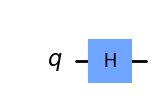

In [63]:
from qiskit import QuantumCircuit

qc = QuantumCircuit(1)
qc.h(0)
qc.draw('mpl')


### Superposition ###
Superposition is a fundamental concept in quantum mechanics, where a quantum system can exist in multiple states simultaneously. The Hadamard gate (draw as [H] in the circuit diagram) mentioned earlier is an example of creating superposition. When a qubit is in a superposition, its state can be represented as a linear combination of the basis states:

### Entanglement ###
Entanglement is another key concept in quantum mechanics, where two or more qubits are correlated in such a way that the state of one qubit cannot be described independently of the state of the other qubits. A simple example of an entangled state is the Bell state.

Since they are enntagled, the result will always be 00 or 11. This is because the state of the first qubit cannot be described independently of the state of the second qubit.

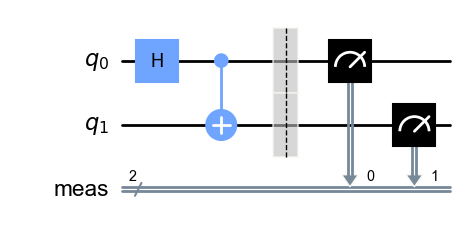

In [64]:
bell_circuit = QuantumCircuit(2)
bell_circuit.h(0)
bell_circuit.cx(0, 1)
bell_circuit.measure_all()
bell_circuit.draw('mpl')


1. Start with a two-qubit system in the state $|00\rangle$:

$$
|00\rangle = |0\rangle \otimes |0\rangle = 
\begin{pmatrix}
1 \\
0
\end{pmatrix} \otimes
\begin{pmatrix}
1 \\
0
\end{pmatrix} =
\begin{pmatrix}
1 \\
0 \\
0 \\
0
\end{pmatrix}
$$

2. Apply a Hadamard gate (H) to the first qubit:

$$
H = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 & 1 \\
1 & -1
\end{pmatrix}
$$

$$
H(|0\rangle) = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 & 1 \\
1 & -1
\end{pmatrix}
\begin{pmatrix}
1 \\
0
\end{pmatrix} = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 \\
1
\end{pmatrix}
$$

Now, the two-qubit system is in the state:

$$
\frac{(|0\rangle + |1\rangle)}{\sqrt{2}} \otimes |0\rangle = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 \\
1
\end{pmatrix} \otimes
\begin{pmatrix}
1 \\
0
\end{pmatrix} = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 \\
0 \\
1 \\
0
\end{pmatrix}
$$

3. Apply a CNOT gate to the two-qubit system. The CNOT gate can be represented by the following matrix:

$$
\mathrm{CNOT} =
\begin{pmatrix}
1 & 0 & 0 & 0 \\
0 & 1 & 0 & 0 \\
0 & 0 & 0 & 1 \\
0 & 0 & 1 & 0
\end{pmatrix}
$$

Now, apply the CNOT gate to the current two-qubit state:

$$
\mathrm{CNOT} \cdot \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 \\
0 \\
1 \\
0
\end{pmatrix} = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 \\
0 \\
0 \\
1
\end{pmatrix}
$$

This resulting state is the entangled state:

$$
\frac{(|00\rangle + |11\rangle)}{\sqrt{2}} = \frac{1}{\sqrt{2}}
\begin{pmatrix}
1 \\
0 \\
0 \\
1
\end{pmatrix}
$$

When we measure the qubits, we should see it be ~50% 00 and ~50% 11. 

In [65]:
from qiskit import IBMQ


IBMQ.save_account(IBMQ_KEY, overwrite=True)

IBMQ.load_account()

C:\Users\wesst\AppData\Local\Temp\ipykernel_23400\911871288.py:4: DeprecationWarning: The package qiskit.providers.ibmq is being deprecated. Please see https://ibm.biz/provider_migration_guide to get instructions on how to migrate to qiskit-ibm-provider (https://github.com/Qiskit/qiskit-ibm-provider) and qiskit-ibm-runtime (https://github.com/Qiskit/qiskit-ibm-runtime).
  IBMQ.save_account(IBMQ_KEY, overwrite=True)
C:\Users\wesst\AppData\Local\Temp\ipykernel_23400\911871288.py:4: DeprecationWarning: The qiskit.IBMQ entrypoint and the qiskit-ibmq-provider package (accessible from 'qiskit.providers.ibmq`) are deprecated and will be removed in a future release. Instead you should use the qiskit-ibm-provider package which is accessible from 'qiskit_ibm_provider'. You can install it with 'pip install qiskit_ibm_provider'. Just replace 'qiskit.IBMQ' with 'qiskit_ibm_provider.IBMProvider'
  IBMQ.save_account(IBMQ_KEY, overwrite=True)


<AccountProvider for IBMQ(hub='ibm-q', group='open', project='main')>

In [66]:
provider = IBMQ.get_provider(hub='ibm-q')

data = []

for backend in provider.backends():
    backend_data = {
        'Name': backend.name(),
        'N Qubits': backend.configuration().n_qubits,
        'Simulator': backend.configuration().simulator,
        'Gate_Set': backend.configuration().basis_gates,
        'Operational': backend.status().operational,
        'Pending Jobs': backend.status().pending_jobs
    }
    data.append(backend_data)
df_all = pd.DataFrame(data)
df_all

,Name,N Qubits,Simulator,Gate_Set,Operational,Pending Jobs
0,ibmq_qasm_simulator,32,True,"[u1, u2, u3, u, p, r, rx, ry, rz, cx, cy, cz, ...",True,0
1,simulator_statevector,32,True,"[u1, u2, u3, u, p, r, rx, ry, rz, id, x, y, z,...",True,0
2,simulator_mps,100,True,"[unitary, t, tdg, id, cp, u1, u2, u3, u, cx, c...",True,0
3,simulator_extended_stabilizer,63,True,"[u0, u1, cx, cz, id, x, y, z, h, s, sdg, sx, t...",True,0
4,simulator_stabilizer,5000,True,"[cx, cy, cz, id, x, y, z, h, s, sdg, sx, swap,...",True,0
5,ibm_brisbane,127,False,"[id, rz, sx, x, ecr, reset]",True,235
6,ibm_kyoto,127,False,"[id, rz, sx, x, ecr, reset]",True,31
7,ibm_osaka,127,False,"[id, rz, sx, x, ecr, reset]",True,0


In [67]:
Nonsimulator_backends = provider.backends(filters=lambda x: not x.configuration().simulator and x.configuration().n_qubits >= 5)

data = []

for backend in Nonsimulator_backends:
    backend_data = {
        'Name': backend.name(),
        'N Qubits': backend.configuration().n_qubits,
        'Operational': backend.status().operational,
        'Pending Jobs': backend.status().pending_jobs
        
    }
    data.append(backend_data)

df_quantum_comp = pd.DataFrame(data)
df_quantum_comp

,Name,N Qubits,Operational,Pending Jobs
0,ibm_brisbane,127,True,235
1,ibm_kyoto,127,True,31
2,ibm_osaka,127,True,0


In [68]:
#least busy backend
from qiskit.tools.monitor import job_monitor
from qiskit.providers.ibmq import least_busy
backend = least_busy(provider.backends(filters=lambda x: not x.configuration().simulator and x.configuration().n_qubits >= 5))
print("Least busy backend: ", backend)
print('Status: ', backend.status().pending_jobs)
print('Status message: ',backend.status().status_msg)


Least busy backend:  ibm_osaka
Status:  0
Status message:  active


c:\Users\wesst\.virtualenvs\qiskit_finance_capstone-tJsEZMkD\Lib\site-packages\qiskit\visualization\circuit\matplotlib.py:266: FutureWarning: The default matplotlib drawer scheme will be changed to "iqp" in a following release. To silence this warning, specify the current default explicitly as style="clifford", or the new default as style="iqp".
  self._style, def_font_ratio = load_style(self._style)


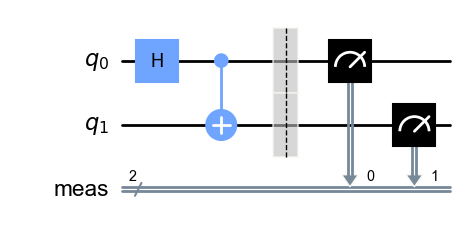

In [69]:
bell_circuit.draw('mpl')

In [70]:
import qiskit.tools.jupyter
%qiskit_job_watcher

Accordion(children=(VBox(layout=Layout(max_width='710px', min_width='710px')),), layout=Layout(max_height='500…

<IPython.core.display.Javascript object>

https://quantum-computing.ibm.com/services/resources?tab=yours 
https://quantum-computing.ibm.com/jobs

In [71]:
# backend = provider.get_backend('ibmq_qasm_simulator')
if backend.status().pending_jobs > 35:
    backend = provider.get_backend('ibmq_qasm_simulator')
    print("Too many pending jobs 🫤, running on simulator \nWon't see affect of noise")


from qiskit import transpile
from qiskit import execute
from qiskit.tools.visualization import plot_histogram, plot_bloch_multivector
job = execute(bell_circuit, backend=backend, shots=1024)
result = job.result()
counts = result.get_counts(bell_circuit)
# plot_histogram(counts)

from qiskit.tools.monitor import job_monitor
job_monitor(job)

Job Status: job has successfully run


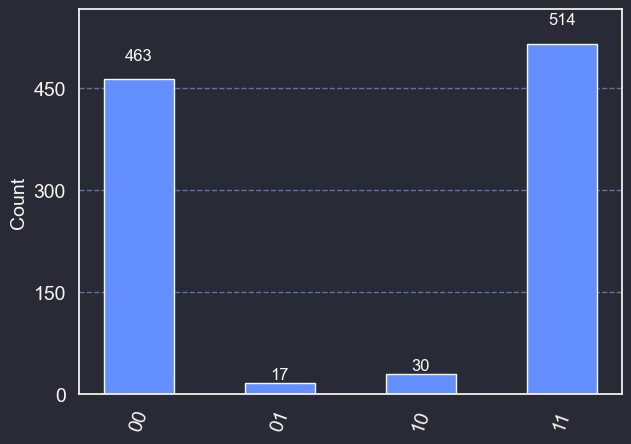

In [72]:
plt.rcParams['axes.grid'] = False
plot_histogram(counts)

### Why the weird results? Noise! ###
As you can see from the above histogram, the results aren't exactly 50% 00 and 50% 11. This deviation from the idea outcome is primarily due to the presence of noise in the quantum computer. Real quantum devices are subject to various types of noise, such as thermal fluctuations, control errors, and other environmental factors, which can introduce errors during the execution of quantum gates or qubit measurements. These errors lead to imperfect operations and can cause the final results to deviate from the expected theoretical distribution. Researchers are actively working on improving quantum devices' error rates and developing error mitigation techniques to achieve more accurate results in the future.

### Using a simulator ###
We can use quantum simulators for the backend as well. Quantum simulators generally have negligible error rates as they are classical software implementations designed to simulate the behavior of an ideal quantum computer. Since they run on classical computers, they do not suffer from the same noise and error issues that real quantum devices face. Simulators provide a convenient way to test and debug quantum algorithms without worrying about the impact of noise on the results.

### For demo purposes, we will use the simulator. ###
Backend can be changed if desired.

In [73]:


from qiskit.algorithms.minimum_eigensolvers import NumPyMinimumEigensolver, QAOA, SamplingVQE
from qiskit.algorithms.optimizers import COBYLA
from qiskit.circuit.library import TwoLocal
from qiskit.result import QuasiDistribution
from qiskit_aer.primitives import Sampler
from qiskit_finance.applications.optimization import PortfolioOptimization
from qiskit_finance.data_providers import RandomDataProvider
from qiskit_optimization.algorithms import MinimumEigenOptimizer
from qiskit_finance import QiskitFinanceError
from qiskit_finance.data_providers import *
import datetime
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters

import numpy as np
import matplotlib.pyplot as plt
import datetime

C:\Users\wesst\AppData\Local\Temp\ipykernel_23400\1224847272.py:1: DeprecationWarning: ``qiskit.algorithms`` has been migrated to an independent package: https://github.com/qiskit-community/qiskit-algorithms. The ``qiskit.algorithms`` import path is deprecated as of qiskit-terra 0.25.0 and will be removed no earlier than 3 months after the release date. Please run ``pip install qiskit_algorithms`` and use ``import qiskit_algorithms`` instead.
  from qiskit.algorithms.minimum_eigensolvers import NumPyMinimumEigensolver, QAOA, SamplingVQE


In [74]:
df.index[0],df.index[-1]

(Timestamp('2018-01-02 00:00:00'), Timestamp('2023-12-07 00:00:00'))

In [75]:
class AlphaVantageDataProvider(BaseDataProvider):
    def __init__(self, stocks_list,start_date,end_date):
        super().__init__()
        self._stocks = stocks_list
        self._start_date = start_date
        self._end_date = end_date
        self._data = []
        self.stock_data = get_adj_close_df(self._stocks,
                                self._start_date.strftime('%Y-%m-%d'), 
                                self._end_date.strftime('%Y-%m-%d'))

    def run(self):

        self._data = []
        for stock in self._stocks:
            stock_value = self.stock_data[stock]
            self._data.append(stock_value)

stocks = df.columns
data = AlphaVantageDataProvider(stocks, df.index[0], df.index[-1])
data.run()

cov_matrix_array = np.array(cov_matrix)
returns_array = np.array(returns)

100%|██████████| 20/20 [00:21<00:00,  1.10s/it]


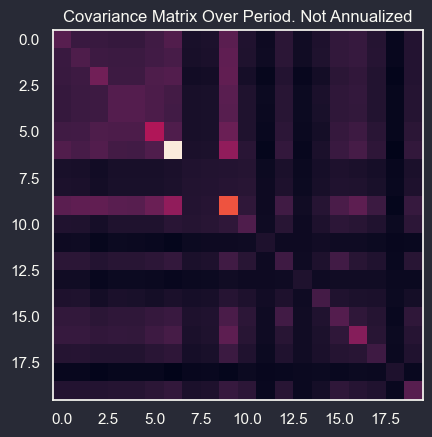

We will use PyPortfolio Opt for covariance matrix and returns


In [76]:
mu = data.get_period_return_mean_vector()
sigma = data.get_period_return_covariance_matrix()
plt.imshow(sigma)
plt.title('Covariance Matrix Over Period. Not Annualized')
plt.show()
print('We will use PyPortfolio Opt for covariance matrix and returns')

In [77]:
from qiskit.algorithms.minimum_eigensolvers import NumPyMinimumEigensolver, QAOA, SamplingVQE
from qiskit.algorithms.optimizers import COBYLA
from qiskit.circuit.library import TwoLocal
from qiskit.result import QuasiDistribution
from qiskit_aer.primitives import Sampler
from qiskit_finance.applications.optimization import PortfolioOptimization
from qiskit_finance.data_providers import RandomDataProvider
from qiskit_optimization.algorithms import MinimumEigenOptimizer
import numpy as np
import matplotlib.pyplot as plt
import datetime

num_assets = len(stocks)
seed = 123


q = 0.5  # set risk factor
budget = num_assets - 2 # set budget
penalty = num_assets  # set parameter to scale the budget penalty term

portfolio = PortfolioOptimization(
    expected_returns=returns_array, covariances=cov_matrix_array, risk_factor=q, budget=budget
)


qp = portfolio.to_quadratic_program()
qp

def print_result(result):
    selection = result.x
    value = result.fval
    print("Optimal: selection {}, value {:.4f}".format(selection, value))
    print("---------------------------------------------------")
    #print which stocks are selected
    print("Selected stocks:")
    for i in range(len(selection)):
        if selection[i] == 1:
            print(stocks[i])

    eigenstate = result.min_eigen_solver_result.eigenstate
    probabilities = (
        eigenstate.binary_probabilities()
        if isinstance(eigenstate, QuasiDistribution)
        else {k: np.abs(v) ** 2 for k, v in eigenstate.to_dict().items()}
    )
    print("\n----------------- Full result ---------------------")
    print("selection\tvalue\t\tprobability")
    print("---------------------------------------------------")
    probabilities = sorted(probabilities.items(), key=lambda x: x[1], reverse=True)

    for k, v in probabilities:
        x = np.array([int(i) for i in list(reversed(k))])
        value = portfolio.to_quadratic_program().objective.evaluate(x)
        print("%10s\t%.4f\t\t%.4f" % (x, value, v))

    print("---------------------------------------------------")


    selections = []
    values = []
    probs = []
    for k, v in probabilities:
        x = np.array([int(i) for i in list(reversed(k))])
        value = portfolio.to_quadratic_program().objective.evaluate(x)
        selections.append(x)
        values.append(value)
        probs.append(v)

    sorted_data = sorted(zip(selections, values, probs), key=lambda x: x[2], reverse=True)
    if len(sorted_data) > 10:
        sorted_data = sorted_data[:10]

    selections, values, probs = [list(t) for t in zip(*sorted_data)]
    
    plt.style.use(matplotx.styles.dracula)
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))  

    bar_width = 0.35
    bar_positions = np.arange(len(selections))


    axs[0].barh(bar_positions, probs, bar_width, label='Probability', color ='tab:blue')
    axs[0].set_yticks(bar_positions)
    axs[0].set_yticklabels([str(sel) for sel in selections])
    axs[0].set_xlabel('Probability')
    axs[0].set_title('Probability for each Selection')
    axs[0].grid(axis='x')
    axs[0].invert_yaxis()
    axs[0].xaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:.0%}".format(x)))


    axs[1].barh(bar_positions, values, bar_width, label='Value', color ='tab:blue')
    axs[1].set_yticks(bar_positions)
    axs[1].set_yticklabels([str(sel) for sel in selections])
    axs[1].set_xlabel('Value')
    axs[1].set_title('Value for each Selection')
    axs[1].grid(axis='x')
    axs[1].invert_xaxis()

    plt.tight_layout()
    plt.show()


In [78]:

print('Quadratic Program for Portfolio Optimization')
print("---------------------------------------------------\n")
print(portfolio.to_quadratic_program().export_as_lp_string())

Quadratic Program for Portfolio Optimization
---------------------------------------------------

\ This file has been generated by DOcplex
\ ENCODING=ISO-8859-1
\Problem name: Portfolio optimization

Minimize
 obj: - 0.134479247160 x_0 - 0.133361057758 x_1 - 0.126146117955 x_2
      - 0.129036517918 x_3 - 0.128770029412 x_4 - 0.140403877600 x_5
      - 0.159737723076 x_6 - 0.095554535571 x_7 - 0.100736320253 x_8
      - 0.183825964184 x_9 - 0.121536968549 x_10 - 0.071129907347 x_11
      - 0.120427681836 x_12 - 0.073071715215 x_13 - 0.101394453174 x_14
      - 0.132675214187 x_15 - 0.134690084942 x_16 - 0.114162149308 x_17
      - 0.061949952991 x_18 - 0.116745364175 x_19 + [ 0.101171546142 x_0^2
      + 0.143859428132 x_0*x_1 + 0.140528820651 x_0*x_2 + 0.134292731911 x_0*x_3
      + 0.134223478927 x_0*x_4 + 0.155778878356 x_0*x_5 + 0.188478501614 x_0*x_6
      + 0.073826495827 x_0*x_7 + 0.079597079980 x_0*x_8 + 0.208394667005 x_0*x_9
      + 0.089376286929 x_0*x_10 + 0.050367462305 x

Computed Classically
---------------------------------------------------

Optimal: selection [1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.], value 5.2530
---------------------------------------------------
Selected stocks:
AAPL
MSFT
AMZN
GOOGL
GOOG
META
BRK-A
BRK-B
JPM
JNJ
V
PG
UNH
MA
INTC
HD
VZ
DIS

----------------- Full result ---------------------
selection	value		probability
---------------------------------------------------
[1 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1]	5.2530		1.0000
---------------------------------------------------


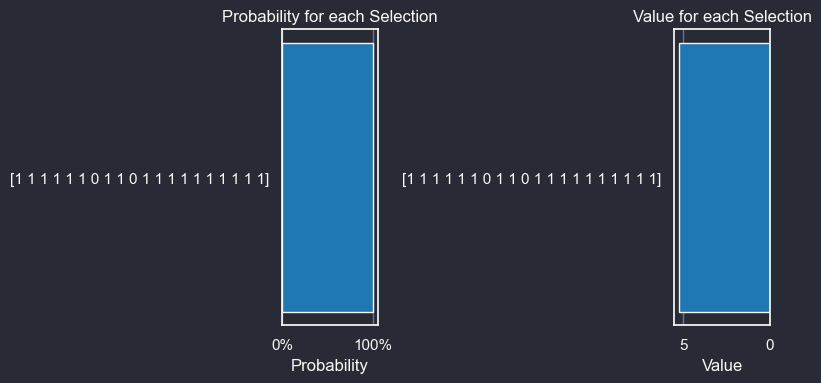

In [79]:
exact_mes = NumPyMinimumEigensolver()
exact_eigensolver = MinimumEigenOptimizer(exact_mes)

result = exact_eigensolver.solve(qp)
classical_result = result
print('Computed Classically')
print("---------------------------------------------------\n")
print_result(result)

C:\Users\wesst\AppData\Local\Temp\ipykernel_23400\3195709294.py:3: DeprecationWarning: The property ``qiskit.utils.algorithm_globals.QiskitAlgorithmGlobals.random_seed`` is deprecated as of qiskit 0.45.0. It will be removed no earlier than 3 months after the release date. This algorithm utility has been migrated to an independent package: https://github.com/qiskit-community/qiskit-algorithms. You can run ``pip install qiskit_algorithms`` and import ``from qiskit_algorithms.utils`` instead. 
  algorithm_globals.random_seed = 1234


Computed with VQE
---------------------------------------------------

Optimal: selection [1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.], value 5.6287
---------------------------------------------------
Selected stocks:
AAPL
MSFT
AMZN
GOOG
META
BRK-A
BRK-B
NVDA
JPM
JNJ
V
PG
UNH
MA
INTC
HD
VZ
DIS

----------------- Full result ---------------------
selection	value		probability
---------------------------------------------------
[1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0]	4.6272		0.0195
[1 1 1 1 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 0]	5.4022		0.0156
[1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1]	5.5889		0.0146
[1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]	5.9406		0.0117
[1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 0 1 0 1 0]	3.8515		0.0098
[1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1]	7.8244		0.0088
[1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 0]	5.7362		0.0088
[1 1 1 0 1 1 1 1 0 1 1 1 1 0 1 1 1 0 1 0]	4.5663		0.0078
[1 1 1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 0 1 0]	4.8779		0.0078
[1 1 1 0 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1]

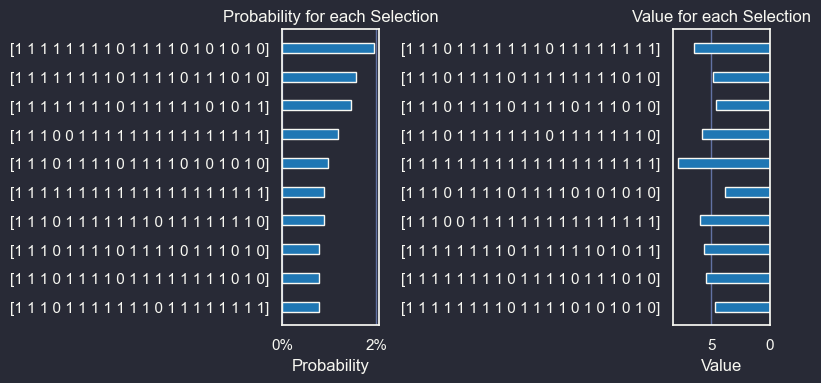

In [80]:
from qiskit.utils import algorithm_globals

algorithm_globals.random_seed = 1234

cobyla = COBYLA()
cobyla.set_options(maxiter=MAX_ITER)
ry = TwoLocal(num_assets, "ry", "cz", reps=3, entanglement="full")
vqe_mes = SamplingVQE(sampler=Sampler(), ansatz=ry, optimizer=cobyla)
vqe = MinimumEigenOptimizer(vqe_mes)
result = vqe.solve(qp)

print('Computed with VQE')
print("---------------------------------------------------\n")
print_result(result)

In [81]:
print('Classical result: ' + str(classical_result.x))
print('VQE result:       ' + str(result.x))

Classical result: [1. 1. 1. 1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
VQE result:       [1. 1. 1. 0. 1. 1. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


In [82]:
# ry.decompose().draw(output='mpl')

In [83]:
def get_port(obj_result):
    portfolios = []
    for i in range(len(obj_result.raw_samples)):
        port = obj_result.raw_samples[i].x
        port = list(port)
        portfolios.append(port)
    return np.array(portfolios)

def get_prob(obj_result):
    probabilities = []
    for i in range(len(obj_result.raw_samples)):
        prob = obj_result.raw_samples[i].probability
        probabilities.append(prob)
    return np.array(probabilities)

def weighted_portfolios(portfolios):
    weighted_portfolios = []

    for portfolio in portfolios:
        num_stocks_included = sum(portfolio)
        weight = 1 / num_stocks_included if num_stocks_included > 0 else 0
        weighted_portfolio = [stock_included * weight for stock_included in portfolio]
        weighted_portfolios.append(weighted_portfolio)
    return np.array(weighted_portfolios)
    
def portfolios_string(portfolios):
    portfolios_string = []
    for portfolio in portfolios:
        portfolio_string = str(portfolio)
        portfolios_string.append(portfolio_string)
    return portfolios_string




def quantum_portfolio_returns(weighted_portfolios_array, returns_array):
    returns_quantum = weighted_portfolios_array.dot(returns_array)
    return returns_quantum

def quantum_portfolio_std(weighted_portfolios_array, cov_matrix_array):
    std_quantum = np.sqrt((weighted_portfolios_array.T * (cov_matrix_array @ weighted_portfolios_array.T)).sum(axis=0))
    return std_quantum

def quantum_portfolio_sharpe(weighted_portfolios_array, returns_array, cov_matrix_array):
    excess_returns_quantum = weighted_portfolios_array.dot(returns_array) - RISK_FREE_RATE
    std_quantum = np.sqrt((weighted_portfolios_array.T * (cov_matrix_array @ weighted_portfolios_array.T)).sum(axis=0))
    sharpe_quantum = excess_returns_quantum / std_quantum
    return sharpe_quantum

def quant_df(portfolios_str, returns, std, sharpe, probs):
    return pd.DataFrame({'Portfolios': portfolios_str, 'Returns': returns, 'Std': std, 'Sharpe': sharpe, 'Probability': probs})

In [84]:
port = get_port(result)
probabilities = get_prob(result)
weight_port = weighted_portfolios(port)
portfolio_str = portfolios_string(port)
returns_quant = quantum_portfolio_returns(weight_port, returns_array)
std_quant = quantum_portfolio_std(weight_port, cov_matrix_array)
sharpe_test = quantum_portfolio_sharpe(weight_port, returns_array, cov_matrix_array)
df_quantum_portfolios = quant_df(portfolio_str, returns_quant, std_quant, sharpe_test, probabilities)
df_quantum_portfolios

,Portfolios,Returns,Std,Sharpe,Probability
0,[1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1],0.116170,0.218295,0.440550,0.001953
1,[1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1],0.116185,0.218315,0.440578,0.000977
2,[1 0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1],0.115930,0.218271,0.439499,0.000977
3,[0 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1],0.116942,0.221045,0.438562,0.000977
4,[1 1 1 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1],0.117259,0.221219,0.439650,0.000977
...,...,...,...,...,...
725,[0 0 0 0 0 1 0 1 1 1 1 1 0 1 1 0 0 1 1 0],0.106377,0.201251,0.429198,0.000977
726,[1 0 1 0 1 0 0 0 0 1 1 1 0 0 1 0 1 0 1 1],0.118067,0.226618,0.432740,0.000977
727,[0 1 0 1 1 1 0 0 0 1 1 1 0 0 1 0 1 0 1 0],0.120610,0.237465,0.423684,0.000977
728,[1 1 1 0 1 0 1 0 0 1 1 0 0 0 1 0 1 0 1 0],0.128589,0.259309,0.418763,0.000977


c:\Users\wesst\.virtualenvs\qiskit_finance_capstone-tJsEZMkD\Lib\site-packages\cvxpy\reductions\solvers\solving_chain.py:336: FutureWarning: 
    Your problem is being solved with the ECOS solver by default. Starting in 
    CVXPY 1.5.0, Clarabel will be used as the default solver instead. To continue 
    using ECOS, specify the ECOS solver explicitly using the ``solver=cp.ECOS`` 
    argument to the ``problem.solve`` method.
    
  warnings.warn(ECOS_DEPRECATION_MSG, FutureWarning)


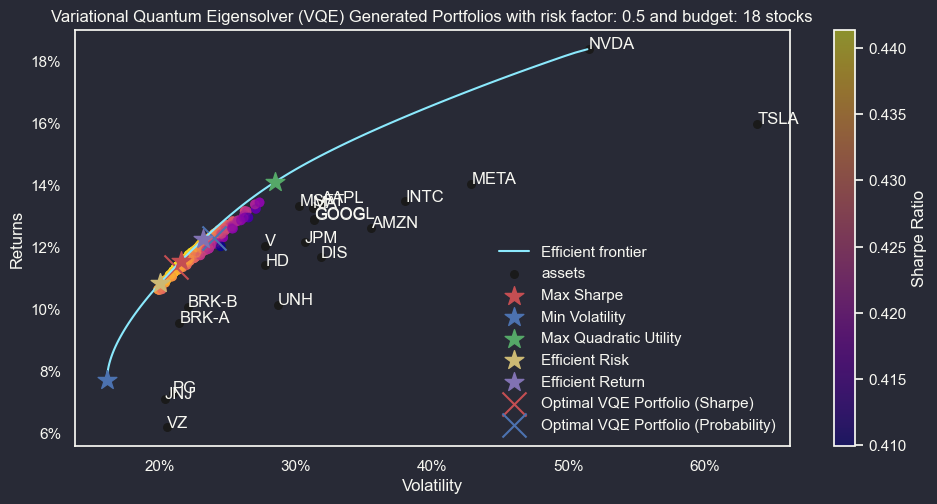

In [85]:
import matplotx
plt.style.use(matplotx.styles.dracula)
ef = EfficientFrontier(returns, cov_matrix, weight_bounds=(0, 1))

fig, ax = plt.subplots(figsize=(10, 5))
plotting.plot_efficient_frontier(ef, ax=ax, show_tickers=True)



ret_tangent, std_tangent, _ = ef_max_sharpe.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="r", label="Max Sharpe", zorder=3)


ret_tangent, std_tangent, _ = ef_min_vol.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="b", label="Min Volatility", zorder=3)


ret_tangent, std_tangent, _ = ef_max_quad_util.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="g", label="Max Quadratic Utility", zorder=3)


ret_tangent, std_tangent, _ = ef_efficient_risk.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="y", label="Efficient Risk", zorder=3)


ret_tangent, std_tangent, _ = ef_efficient_return.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="m", label="Efficient Return", zorder=3)

ax.scatter(df_quantum_portfolios['Std'], df_quantum_portfolios['Returns'],
     c=df_quantum_portfolios['Sharpe'], cmap='plasma')
ax.set_xlabel('Volatility')
ax.set_ylabel('Returns')
ax.set_title(f'Variational Quantum Eigensolver (VQE) Generated Portfolios with risk factor: {q} and budget: {budget} stocks')

sc = ax.scatter(df_quantum_portfolios['Std'], df_quantum_portfolios['Returns'], c=df_quantum_portfolios['Sharpe'], cmap='plasma', alpha=0.5)

cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Sharpe Ratio')

ax.xaxis.grid(False)
ax.yaxis.grid(False)

ax.xaxis.set_major_formatter('{x:.0%}')
ax.yaxis.set_major_formatter('{x:.0%}')


ax.scatter(df_quantum_portfolios['Std'][df_quantum_portfolios['Sharpe'].idxmax()], 
     df_quantum_portfolios['Returns'][df_quantum_portfolios['Sharpe'].idxmax()],
      marker="x", color='r', s=300, label='Optimal VQE Portfolio (Sharpe)')


ax.scatter(df_quantum_portfolios['Std'][df_quantum_portfolios['Probability'].idxmax()], 
     df_quantum_portfolios['Returns'][df_quantum_portfolios['Probability'].idxmax()],
      marker="x", color='b', s=300, label='Optimal VQE Portfolio (Probability)')

ax.legend(loc = 'lower right')
plt.show()

# Probabilities? #
In simple terms, the probabilities provide a measure of how likely it is that a specific allocation of assets is the optimal solution to the portfolio optimization problem. A higher probability for a particular allocation implies that it is more likely to be the optimal solution, whereas a lower probability indicates that the allocation is less likely to be optimal.

In practice, the optimal asset allocation is usually chosen based on the highest probability state. However, you can also consider the other high-probability states as alternative allocations that may have similar risk-return profiles.

### Some more context for those interested ###
VQE is an algorithm used to find the ground state energy (the lowest eigenvalue) of a given Hamiltonian, which is a mathematical description of a quantum system. The VQE algorithm does this by iteratively updating the parameters of a quantum circuit (ansatz) to minimize the expectation value of the Hamiltonian.

In the context of portfolio optimization, the Hamiltonian represents the risk-return trade-off of a portfolio. The lowest eigenvalue of the Hamiltonian corresponds to the optimal allocation of assets in the portfolio, which minimizes the risk for a given return or maximizes the return for a given risk

Probabilities are computed by taking the square of the absolute value of the amplitude of each state in the final quantum state, after the VQE algorithm converges. These probabilities represent the likelihood of each possible asset allocation, with the highest probability corresponding to the optimal allocation.

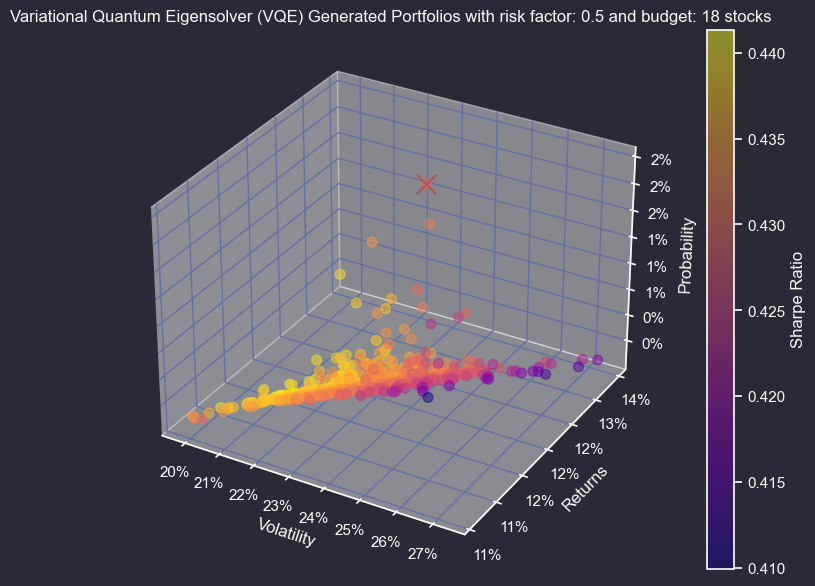

In [86]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 7), dpi=100)
ax = fig.add_subplot(111, projection='3d')

# Increase marker size
sct = ax.scatter(df_quantum_portfolios['Std'], df_quantum_portfolios['Returns'], df_quantum_portfolios['Probability'],
                 c=df_quantum_portfolios['Sharpe'], cmap='plasma', s=50, zorder=1, alpha=0.5)

# Add a color bar
cbar = fig.colorbar(sct, ax=ax)
cbar.set_label('Sharpe Ratio')

ax.set_xlabel('Volatility')
ax.set_ylabel('Returns')
ax.set_zlabel('Probability')

# Use a more descriptive title
ax.set_title(f'Variational Quantum Eigensolver (VQE) Generated Portfolios with risk factor: {q} and budget: {budget} stocks')

ax.xaxis.set_major_formatter('{x:.0%}')
ax.yaxis.set_major_formatter('{x:.0%}')
ax.zaxis.set_major_formatter('{x:.0%}')

# Add a grid
ax.grid(True)

# Add a legend
ax.scatter(df_quantum_portfolios['Std'][df_quantum_portfolios['Probability'].idxmax()], 
           df_quantum_portfolios['Returns'][df_quantum_portfolios['Probability'].idxmax()],
           df_quantum_portfolios['Probability'][df_quantum_portfolios['Probability'].idxmax()],
           marker="x", color='r', s=200, label='Optimal VQE Portfolio', zorder=2)




plt.show()


While we are limited to not knowing weights in each portfolio, we will use 1/n for each portfolio to represent the weights. We can then build a basic portfolio that we can then compare against the PyPortfolioOpt portfolios.

Parameters for adjustment:
* q = risk scalar 
* budget = total stocks to buy


We are going to adjust the budgets and risk scalar to see how the portfolios change. We will also compare the portfolios to the PyPortfolioOpt portfolios.

In [87]:
Portfolios_DF = pd.DataFrame(columns=['Portfolios', 'Returns', 'Std', 'Sharpe'])
import warnings

warnings.filterwarnings("ignore", category=RuntimeWarning)

for q in np.linspace(0.1, 1.0, num = 10):
    for budget in range(2, len(stocks)+1):
        portfolio = PortfolioOptimization(
            expected_returns=returns_array, covariances=cov_matrix_array, risk_factor=q, budget=budget
        )
        qp = portfolio.to_quadratic_program()

        cobyla = COBYLA()
        cobyla.set_options(maxiter=MAX_ITER)
        ry = TwoLocal(num_assets, "ry", "cz", reps=3, entanglement="full")
        vqe_mes = SamplingVQE(sampler=Sampler(), ansatz=ry, optimizer=cobyla)
        vqe = MinimumEigenOptimizer(vqe_mes)
        result = vqe.solve(qp)


        port = get_port(result)
        probabilities = get_prob(result)
        weight_port = weighted_portfolios(port)
        portfolio_str = portfolios_string(port)
        returns_quant = quantum_portfolio_returns(weight_port, returns_array)
        std_quant = quantum_portfolio_std(weight_port, cov_matrix_array)
        sharpe_test = quantum_portfolio_sharpe(weight_port, returns_array, cov_matrix_array)
        df_quantum_portfolios = quant_df(portfolio_str, returns_quant, std_quant, sharpe_test, probabilities)
        #add budget and risk factor to dataframe
        df_quantum_portfolios['Budget'] = budget
        df_quantum_portfolios['Risk Factor'] = q
        Portfolios_DF = pd.concat([Portfolios_DF, df_quantum_portfolios], ignore_index=True)


In [ ]:
Portfolios_DF = Portfolios_DF.sort_values(by=['Sharpe'], ascending=False)
Portfolios_DF = Portfolios_DF.dropna()
Portfolios_DF = Portfolios_DF.drop_duplicates(subset=['Portfolios'])
Portfolios_DF

,Portfolios,Returns,Std,Sharpe,Probability,Budget,Risk Factor
41873,[1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1],0.100802,0.223099,0.362181,0.000977,18.0,0.3
25556,[1 1 1 1 0 0 0 1 1 1 1 1 0 1 1 1 0 1 1 1],0.099361,0.219127,0.362169,0.000977,15.0,0.2
128993,[1 1 1 0 1 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1],0.100784,0.223064,0.362157,0.000977,17.0,0.9
25555,[1 1 1 0 1 0 0 1 1 1 1 1 0 1 1 1 0 1 1 1],0.099341,0.219099,0.362122,0.008789,15.0,0.2
39460,[1 1 1 1 0 0 0 1 1 1 1 1 1 1 1 1 0 1 1 1],0.099791,0.220365,0.362084,0.000977,14.0,0.3
...,...,...,...,...,...,...,...
131777,[0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0],0.064426,0.207671,0.213925,0.001953,2.0,1.0
75743,[0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0],0.065789,0.216048,0.211939,0.000977,5.0,0.6
44713,[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0],0.136561,0.654886,0.177987,0.000977,3.0,0.4
118309,[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0],0.055194,0.198839,0.176995,0.002930,3.0,0.9


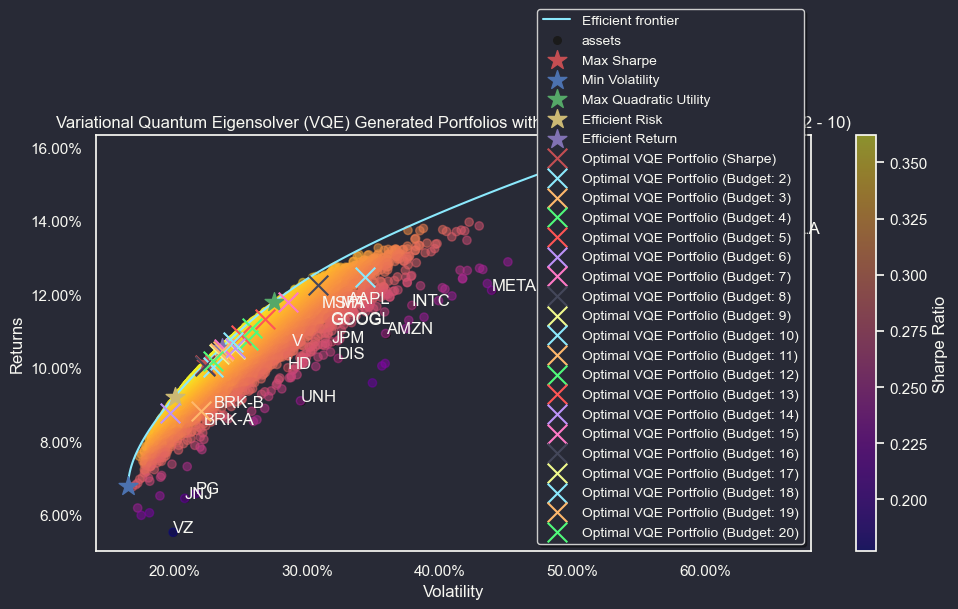

In [ ]:
ef = EfficientFrontier(returns, cov_matrix, weight_bounds=(0, 1))

import matplotx
plt.style.use(matplotx.styles.dracula)


fig, ax = plt.subplots(figsize=(10, 5))
plotting.plot_efficient_frontier(ef, ax=ax, show_tickers=True)


ret_tangent, std_tangent, _ = ef_max_sharpe.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="r", label="Max Sharpe", zorder=3)

ret_tangent, std_tangent, _ = ef_min_vol.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="b", label="Min Volatility", zorder=3)


ret_tangent, std_tangent, _ = ef_max_quad_util.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="g", label="Max Quadratic Utility", zorder=3)


ret_tangent, std_tangent, _ = ef_efficient_risk.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="y", label="Efficient Risk", zorder=3)


ret_tangent, std_tangent, _ = ef_efficient_return.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="m", label="Efficient Return", zorder=3)


sc = ax.scatter(Portfolios_DF['Std'], Portfolios_DF['Returns'], c=Portfolios_DF['Sharpe'], cmap='plasma', alpha=0.5)
ax.set_xlabel('Volatility')
ax.set_ylabel('Returns')
ax.set_title('Variational Quantum Eigensolver (VQE) Generated Portfolios with risk factor: (0.1 - 1.0) and budget: (2 - 10)')
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Sharpe Ratio')


ax.scatter(Portfolios_DF['Std'][Portfolios_DF['Sharpe'].idxmax()],
        Portfolios_DF['Returns'][Portfolios_DF['Sharpe'].idxmax()],
        marker="x", color='r', s=200, label='Optimal VQE Portfolio (Sharpe)', alpha=1, zorder=3)


highest_prob_indices = Portfolios_DF.groupby('Budget')['Probability'].idxmax()


count = 0
for idx in highest_prob_indices:
    
    ax.scatter(Portfolios_DF['Std'][idx],
               Portfolios_DF['Returns'][idx],
               marker="x", s=200, label=f'Optimal VQE Portfolio (Budget: {int(Portfolios_DF["Budget"][idx])})', alpha=1, zorder=3)
    count += 1


ax.xaxis.set_major_formatter('{x:.2%}')
ax.yaxis.set_major_formatter('{x:.2%}')

ax.xaxis.grid(False)
ax.yaxis.grid(False)

ax.legend(loc = 'lower right', fancybox=True, shadow=True, fontsize = 10)

plt.show()

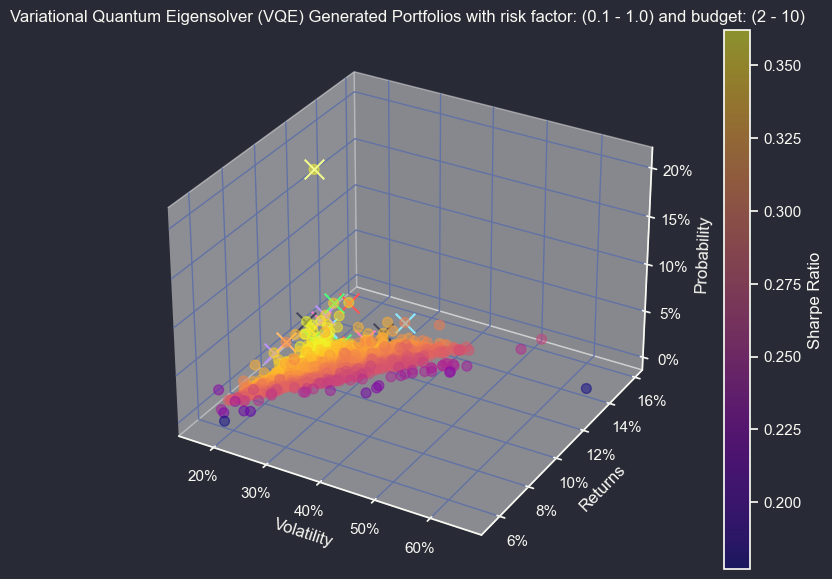

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(12, 7), dpi=100)
ax = fig.add_subplot(111, projection='3d')

sct = ax.scatter(Portfolios_DF['Std'], Portfolios_DF['Returns'], Portfolios_DF['Probability'],
                 c=Portfolios_DF['Sharpe'], cmap='plasma', s=50, zorder=0, alpha=0.5)

cbar = fig.colorbar(sct, ax=ax)
cbar.set_label('Sharpe Ratio')

ax.set_xlabel('Volatility')
ax.set_ylabel('Returns')
ax.set_zlabel('Probability')

ax.set_title(f'Variational Quantum Eigensolver (VQE) Generated Portfolios with risk factor: (0.1 - 1.0) and budget: (2 - 10)')

ax.xaxis.set_major_formatter('{x:.0%}')
ax.yaxis.set_major_formatter('{x:.0%}')
ax.zaxis.set_major_formatter('{x:.0%}')

# Add a grid
ax.grid(True)
colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'orange']
count = 0
# Add a legend
for idx in highest_prob_indices:
    ax.scatter(Portfolios_DF['Std'][idx],
               Portfolios_DF['Returns'][idx],
               Portfolios_DF['Probability'][idx],
               marker="x", s=200, label=f'Optimal VQE Portfolio (Budget: {int(Portfolios_DF["Budget"][idx])})', alpha=1, zorder=3)
    count += 1

plt.show()

 

In [ ]:
best_portfolio = Portfolios_DF['Portfolios'][Portfolios_DF['Sharpe'].idxmax()]
output_list = [int(x) for x in best_portfolio.strip('[]').split()]
output_list 
weighted = [i / sum(output_list) for i in output_list]
weighted
port_dicts = dict(zip(stocks, weighted))
port_dicts 


{'AAPL': 0.058823529411764705,
 'MSFT': 0.058823529411764705,
 'AMZN': 0.058823529411764705,
 'GOOGL': 0.058823529411764705,
 'GOOG': 0.0,
 'META': 0.0,
 'TSLA': 0.0,
 'BRK-A': 0.058823529411764705,
 'BRK-B': 0.058823529411764705,
 'NVDA': 0.058823529411764705,
 'JPM': 0.058823529411764705,
 'JNJ': 0.058823529411764705,
 'V': 0.058823529411764705,
 'PG': 0.058823529411764705,
 'UNH': 0.058823529411764705,
 'MA': 0.058823529411764705,
 'INTC': 0.058823529411764705,
 'HD': 0.058823529411764705,
 'VZ': 0.058823529411764705,
 'DIS': 0.058823529411764705}

In [ ]:
highest_prob_indices = Portfolios_DF.groupby('Budget')['Probability'].idxmax()

port_dicts_prob_budgets = {}

for idx in highest_prob_indices:
    best_prob_port = Portfolios_DF['Portfolios'][idx]
    output_list_prob = [int(x) for x in best_prob_port.strip('[]').split()]
    weighted_prob = [i / sum(output_list_prob) for i in output_list_prob]
    port_dicts_prob = dict(zip(stocks, weighted_prob))
    port_dicts_prob_budgets[f'Budget {int(Portfolios_DF["Budget"][idx])}'] = port_dicts_prob



In [ ]:
quantum_dict = DiscreteAllocation(port_dicts, earliest_prices, total_portfolio_value=10000).greedy_portfolio()
quantum_dict = {'Optimal VQE Portfolio (Sharpe)': quantum_dict}


In [ ]:

discrete_allocation.update(quantum_dict)
for budget, port_dicts_prob in port_dicts_prob_budgets.items():
    prob_dict = DiscreteAllocation(port_dicts_prob, earliest_prices, total_portfolio_value=10000).greedy_portfolio()
    prob_dict = {f'Optimal VQE Portfolio ({budget})': prob_dict}
    discrete_allocation.update(prob_dict)



In [ ]:
strategies_with_quantum = pd.DataFrame(index = df.index)
for strategy in discrete_allocation.keys():
    strategies_with_quantum[strategy] = simple_backtest(df, discrete_allocation, strategy)[f'Cumulative Appreciation: {strategy}']

strategies_with_quantum

,Max Sharpe,Min Volatility,Max Quadratic Utility,Efficient Risk,Efficient Return,Optimal VQE Portfolio (Sharpe),Optimal VQE Portfolio (Budget 2),Optimal VQE Portfolio (Budget 3),Optimal VQE Portfolio (Budget 4),Optimal VQE Portfolio (Budget 5),...,Optimal VQE Portfolio (Budget 11),Optimal VQE Portfolio (Budget 12),Optimal VQE Portfolio (Budget 13),Optimal VQE Portfolio (Budget 14),Optimal VQE Portfolio (Budget 15),Optimal VQE Portfolio (Budget 16),Optimal VQE Portfolio (Budget 17),Optimal VQE Portfolio (Budget 18),Optimal VQE Portfolio (Budget 19),Optimal VQE Portfolio (Budget 20)
Date,,,,,,,,,,,,,,,,,,,,,
2018-01-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-01-03,0.006638,-0.005857,0.011284,0.003295,0.008365,0.006703,0.038332,0.012997,-0.003773,0.005492,...,0.009554,0.008193,0.008065,0.011285,0.007739,0.007532,0.007535,0.007338,0.007119,0.003484
2018-01-04,0.011895,-0.002861,0.018777,0.007623,0.014166,0.010974,0.043338,0.014808,-0.001339,0.013340,...,0.013042,0.010778,0.011057,0.013239,0.010617,0.011472,0.010263,0.010352,0.010401,0.006746
2018-01-05,0.019875,-0.000075,0.027301,0.015158,0.022229,0.019890,0.057521,0.026419,0.002701,0.021453,...,0.020758,0.021407,0.021346,0.022702,0.019625,0.020550,0.019501,0.019710,0.019059,0.016493
2018-01-08,0.022382,0.002336,0.031791,0.017415,0.024895,0.021869,0.065266,0.029283,0.005048,0.022252,...,0.023072,0.027820,0.029213,0.032500,0.021746,0.022751,0.025718,0.026603,0.024660,0.023090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-20,1.267163,0.355196,1.897608,1.029352,1.359070,1.159081,2.947075,0.670935,0.856853,1.786426,...,1.115701,1.830998,1.668337,1.580216,1.018479,1.062966,1.348693,1.396625,1.401907,1.276346
2023-04-21,1.271749,0.372301,1.893332,1.038339,1.361562,1.163067,2.939781,0.667370,0.852250,1.774695,...,1.118905,1.838966,1.678610,1.590341,1.018795,1.067276,1.357512,1.402956,1.410748,1.286138
2023-04-24,1.268621,0.370646,1.885017,1.035622,1.358901,1.160601,2.944338,0.679642,0.839018,1.768808,...,1.116054,1.828271,1.668769,1.581037,1.019806,1.069038,1.352095,1.393452,1.403929,1.276812


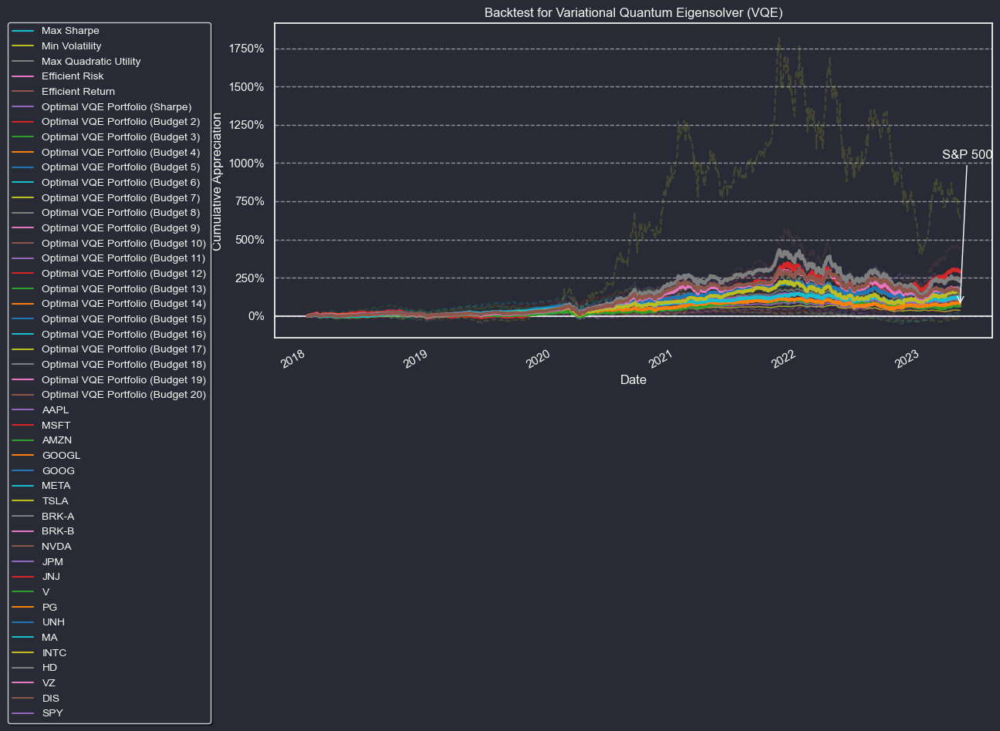

In [ ]:
strategies_stocks_and_quantum = pd.concat([strategies_with_quantum, stock_cum_appreciation], axis=1)

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
colors = list(mcolors.TABLEAU_COLORS)[::-1]

plt.style.use(matplotx.styles.dracula)
fig, ax = plt.subplots(figsize=(12, 6))
strategies_stocks_and_quantum.plot(ax=ax, title='Backtest for Variational Quantum Eigensolver (VQE)', color=colors)
ax.set_ylabel('Cumulative Appreciation')
ax.set_xlabel('Date')
ax.legend(loc='upper left', ncol = 1, shadow=True, fancybox=True, bbox_to_anchor=(-.38, 1.02), fontsize=10)

ax.yaxis.set_major_formatter('{x:.0%}')

for i in range(0,5):
    ax.lines[i].set_linewidth(1)
    ax.lines[i].set_alpha(.9)
  
for i in range(5,15):
    ax.lines[i].set_linewidth(3)
    ax.lines[i].set_alpha(1)
    ax.lines[i].set_zorder(3)


for i in range(15,len(strategies_stocks_and_quantum.columns)-1):
    ax.lines[i].set_alpha(.2)
    ax.lines[i].set_linestyle('dashed')
ax.lines[len(strategies_stocks_and_quantum.columns)-1].alpha = 0.8
ax.lines[len(strategies_stocks_and_quantum.columns)-1].set_linewidth(1)
x_coord = benchmark_plot.index[-1]
y_coord = benchmark_plot.iloc[-1, 0]

text_x = 1
text_y = y_coord - 0.10

arrow_props = dict(arrowstyle='->', facecolor='red', edgecolor='white',
                   linewidth=1, alpha=1, mutation_scale=15)

ax.annotate('S&P 500',
            xy=(x_coord, y_coord),
            xytext=(text_x, .6),
            xycoords='data',
            textcoords='axes fraction',
            arrowprops=arrow_props,
            horizontalalignment='right',
            verticalalignment='top',
            fontsize=12)



ax.axhline(y=0, color='white', linestyle='-', alpha=0.8)
ax.grid(which='major', axis='y', linestyle='--', c = 'white', alpha = 0.5)

ax.xaxis.grid(False)
ax.yaxis.grid(True)

plt.show()

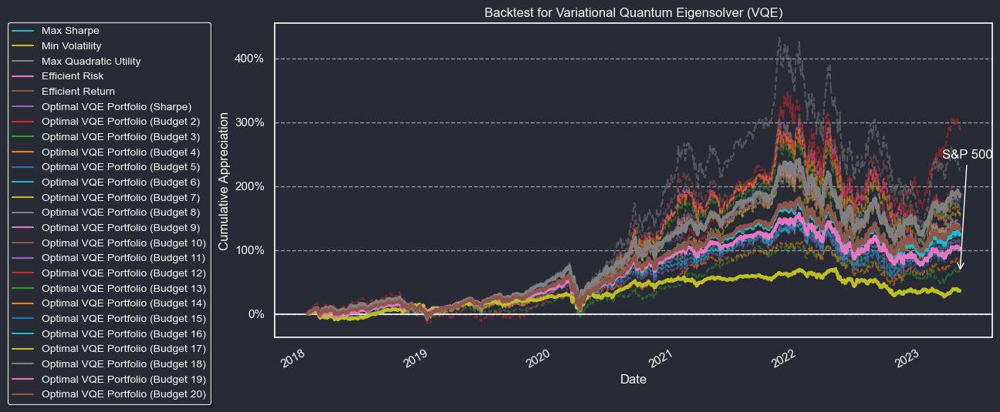

In [ ]:
# strategies_stocks_and_quantum = pd.concat([strategies_with_quantum, stock_cum_appreciation], axis=1)

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
colors = list(mcolors.TABLEAU_COLORS)[::-1]

plt.style.use(matplotx.styles.dracula)
fig, ax = plt.subplots(figsize=(12, 6))
strategies_with_quantum.plot(ax=ax, title='Backtest for Variational Quantum Eigensolver (VQE)', color=colors)
ax.set_ylabel('Cumulative Appreciation')
ax.set_xlabel('Date')
ax.legend(loc='upper left', ncol = 1, shadow=True, fancybox=True, bbox_to_anchor=(-.38, 1.02), fontsize=10)

ax.yaxis.set_major_formatter('{x:.0%}')

for i in range(0,5):
    ax.lines[i].set_linewidth(3)
    ax.lines[i].set_alpha(1)
    ax.lines[i].set_zorder(3)

for i in range(5, len(strategies_with_quantum.columns)):
    # ax.lines[i].set_linewidth(3)
    ax.lines[i].set_alpha(.5)
    ax.lines[i].set_linestyle('dashed')
    # ax.lines[i].set_zorder(3)
  
# for i in range(5,15):
#     ax.lines[i].set_linewidth(3)
#     ax.lines[i].set_alpha(1)
#     ax.lines[i].set_zorder(3)


# for i in range(15,len(strategies_stocks_and_quantum.columns)-1):
#     ax.lines[i].set_alpha(.2)
#     ax.lines[i].set_linestyle('dashed')
# ax.lines[len(strategies_stocks_and_quantum.columns)-1].alpha = 0.8
# ax.lines[len(strategies_stocks_and_quantum.columns)-1].set_linewidth(1)
# x_coord = benchmark_plot.index[-1]
# y_coord = benchmark_plot.iloc[-1, 0]

text_x = 1
text_y = y_coord - 0.10

arrow_props = dict(arrowstyle='->', facecolor='red', edgecolor='white',
                   linewidth=1, alpha=1, mutation_scale=15)

ax.annotate('S&P 500',
            xy=(x_coord, y_coord),
            xytext=(text_x, .6),
            xycoords='data',
            textcoords='axes fraction',
            arrowprops=arrow_props,
            horizontalalignment='right',
            verticalalignment='top',
            fontsize=12)



ax.axhline(y=0, color='white', linestyle='-', alpha=0.8)
ax.grid(which='major', axis='y', linestyle='--', c = 'white', alpha = 0.5)

ax.xaxis.grid(False)
ax.yaxis.grid(True)

plt.show()

In [ ]:
# quantum = strategies_stocks_and_quantum[['Optimal VQE Portfolio (Sharpe)', 'Optimal VQE Portfolio (Budget 2)', 'Optimal VQE Portfolio (Budget 3)', 'Optimal VQE Portfolio (Budget 4)', 'Optimal VQE Portfolio (Budget 5)', 'Optimal VQE Portfolio (Budget 6)', 'Optimal VQE Portfolio (Budget 7)', 'Optimal VQE Portfolio (Budget 8)', 'Optimal VQE Portfolio (Budget 9)', 'Optimal VQE Portfolio (Budget 10)', 'SPY']]
# quantum

quantum = strategies_stocks_and_quantum[['Optimal VQE Portfolio (Sharpe)']]
budget = strategies_stocks_and_quantum[[f'Optimal VQE Portfolio (Budget {i})' for i in range(2,len(stocks)+1)]]
quantum = pd.concat([quantum, budget], axis=1)



In [ ]:
quantum

,Optimal VQE Portfolio (Sharpe),Optimal VQE Portfolio (Budget 2),Optimal VQE Portfolio (Budget 3),Optimal VQE Portfolio (Budget 4),Optimal VQE Portfolio (Budget 5),Optimal VQE Portfolio (Budget 6),Optimal VQE Portfolio (Budget 7),Optimal VQE Portfolio (Budget 8),Optimal VQE Portfolio (Budget 9),Optimal VQE Portfolio (Budget 10),Optimal VQE Portfolio (Budget 11),Optimal VQE Portfolio (Budget 12),Optimal VQE Portfolio (Budget 13),Optimal VQE Portfolio (Budget 14),Optimal VQE Portfolio (Budget 15),Optimal VQE Portfolio (Budget 16),Optimal VQE Portfolio (Budget 17),Optimal VQE Portfolio (Budget 18),Optimal VQE Portfolio (Budget 19),Optimal VQE Portfolio (Budget 20)
Date,,,,,,,,,,,,,,,,,,,,
2018-01-02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-01-03,0.006703,0.038332,0.012997,-0.003773,0.005492,-0.001043,0.018293,0.014792,0.009253,0.006100,0.009554,0.008193,0.008065,0.011285,0.007739,0.007532,0.007535,0.007338,0.007119,0.003484
2018-01-04,0.010974,0.043338,0.014808,-0.001339,0.013340,0.005265,0.024304,0.018576,0.010059,0.008466,0.013042,0.010778,0.011057,0.013239,0.010617,0.011472,0.010263,0.010352,0.010401,0.006746
2018-01-05,0.019890,0.057521,0.026419,0.002701,0.021453,0.009350,0.030712,0.029135,0.020907,0.019046,0.020758,0.021407,0.021346,0.022702,0.019625,0.020550,0.019501,0.019710,0.019059,0.016493
2018-01-08,0.021869,0.065266,0.029283,0.005048,0.022252,0.009969,0.035706,0.045180,0.032037,0.024516,0.023072,0.027820,0.029213,0.032500,0.021746,0.022751,0.025718,0.026603,0.024660,0.023090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-20,1.159081,2.947075,0.670935,0.856853,1.786426,1.222030,1.584733,2.329269,1.690021,1.629514,1.115701,1.830998,1.668337,1.580216,1.018479,1.062966,1.348693,1.396625,1.401907,1.276346
2023-04-21,1.163067,2.939781,0.667370,0.852250,1.774695,1.224532,1.586681,2.341602,1.708137,1.641023,1.118905,1.838966,1.678610,1.590341,1.018795,1.067276,1.357512,1.402956,1.410748,1.286138
2023-04-24,1.160601,2.944338,0.679642,0.839018,1.768808,1.218812,1.580607,2.316348,1.696559,1.632016,1.116054,1.828271,1.668769,1.581037,1.019806,1.069038,1.352095,1.393452,1.403929,1.276812


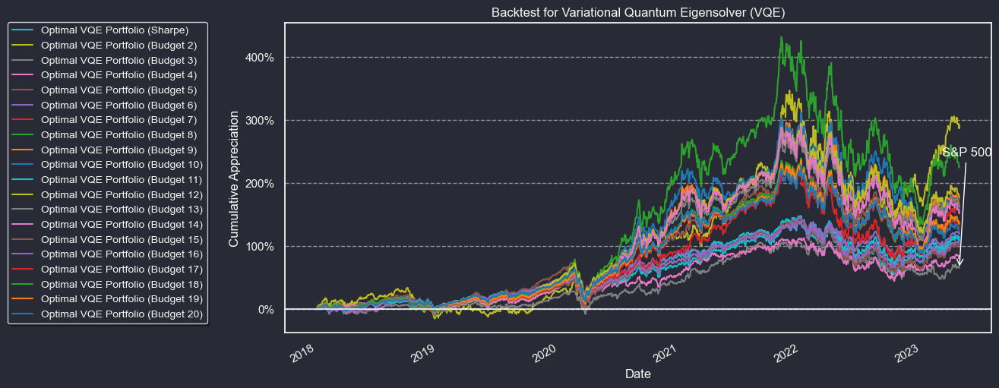

In [ ]:
fig, ax = plt.subplots(figsize=(12, 6))
quantum.plot(ax=ax, title='Backtest for Variational Quantum Eigensolver (VQE)', color=colors)
ax.set_ylabel('Cumulative Appreciation')
ax.set_xlabel('Date')
ax.legend(loc='upper left', ncol = 1, shadow=True, fancybox=True, bbox_to_anchor=(-.4, 1.02), fontsize=10)

ax.yaxis.set_major_formatter('{x:.0%}')

x_coord = benchmark_plot.index[-1]
y_coord = benchmark_plot.iloc[-1, 0]

text_x = 1
text_y = y_coord - 0.10

arrow_props = dict(arrowstyle='->', facecolor='red', edgecolor='white',
                   linewidth=1, alpha=1, mutation_scale=15)

ax.annotate('S&P 500',
            xy=(x_coord, y_coord),
            xytext=(text_x, .6),
            xycoords='data',
            textcoords='axes fraction',
            arrowprops=arrow_props,
            horizontalalignment='right',
            verticalalignment='top',
            fontsize=12)



ax.axhline(y=0, color='white', linestyle='-', alpha=0.8)
ax.grid(which='major', axis='y', linestyle='--', c = 'white', alpha = 0.5)

ax.xaxis.grid(False)
ax.yaxis.grid(True)
plt.show()

### Lets see how portfolios perform in the future using past returns data ###
We use a basic 50/50 split in this model, but it can be adjusted. 

In [ ]:
past_returns_capm = expected_returns.capm_return(past_returns, df_benchmark)
past_cov_matrix = exp_cov(past_returns)
past_returns_capm, past_cov_matrix

past_returns_capm_array = past_returns_capm.to_numpy()
past_cov_matrix_array = past_cov_matrix.to_numpy()


In [ ]:
#find classical portfolio weights with PyPortfolioOpt
ef_past = EfficientFrontier(past_returns_capm, past_cov_matrix, weight_bounds=(0,1))
ef_past_max_sharpe = copy.deepcopy(ef_past) 
ef_past_min_vol = copy.deepcopy(ef_past)
ef_past_max_quad_util = copy.deepcopy(ef_past)
ef_past_efficient_risk = copy.deepcopy(ef_past)
ef_past_efficient_return = copy.deepcopy(ef_past)
past_sharpe = ef_past_max_sharpe.max_sharpe(risk_free_rate=0.02) 
past_min_vol = ef_past_min_vol.min_volatility()
past_max_quad_util = ef_past_max_quad_util.max_quadratic_utility()
past_efficient_risk = ef_past_efficient_risk.efficient_risk(0.3)
past_efficient_return = ef_past_efficient_return.efficient_return(past_returns_capm.max()/1.5)
df_weights_past = pd.DataFrame(index=ef_past.tickers)
df_weights_past['Max Sharpe'] = pd.Series(ef_past_max_sharpe.clean_weights())
df_weights_past['Min Volatility'] = pd.Series(ef_past_min_vol.clean_weights())
df_weights_past['Max Quadratic Utility'] = pd.Series(ef_past_max_quad_util.clean_weights())
df_weights_past['Efficient Risk'] = pd.Series(ef_past_efficient_risk.clean_weights())
df_weights_past['Efficient Return'] = pd.Series(ef_past_efficient_return.clean_weights())
# df_weights_past

earliest_prices_past = []    
for i in df_weights_past.index:
    earliest_price_past = df[i][0]
    earliest_prices_past.append(earliest_price_past)

earliest_prices_past = pd.Series(earliest_prices_past, index=df_weights_past.index)

portfolio_dicts_past = {}
for i in range(5):
    portfolio = df_weights_past.iloc[:,i]
    portfolio = portfolio[portfolio != 0]
    portfolio = portfolio.to_dict()
    portfolio_dicts_past[df_weights_past.columns[i]] = portfolio

discrete_allocation_past = {}
for key, value in portfolio_dicts_past.items():
    discrete_allocation_past[key] = DiscreteAllocation(value, earliest_prices_past, total_portfolio_value=starting_capital).greedy_portfolio()

rows_past = set()
columns_past = discrete_allocation_past.keys()

for col, (nested_dict_past, _) in discrete_allocation_past.items():
    rows_past.update(nested_dict_past.keys())

df_discrete_allocation_past = pd.DataFrame(index=sorted(rows_past), columns=columns_past)

for col, (nested_dict_past, capital) in discrete_allocation_past.items():
    for row, value in nested_dict_past.items():
        df_discrete_allocation_past.at[row, col] = value
    df_discrete_allocation_past.at['Remaining Capital', col] = capital

df_discrete_allocation_past.fillna(0, inplace=True)
df_discrete_allocation_past


,Max Sharpe,Min Volatility,Max Quadratic Utility,Efficient Risk,Efficient Return
AAPL,0.000000,0.00000,2.000000,0.000000,0.000000
AMZN,38.000000,28.00000,35.000000,38.000000,39.000000
BRK-B,12.000000,0.00000,15.000000,12.000000,6.000000
GOOG,17.000000,0.00000,17.000000,17.000000,7.000000
GOOGL,0.000000,0.00000,0.000000,0.000000,9.000000
INTC,5.000000,0.00000,6.000000,5.000000,4.000000
JNJ,5.000000,11.00000,0.000000,5.000000,8.000000
JPM,1.000000,0.00000,5.000000,1.000000,0.000000
MA,3.000000,0.00000,6.000000,3.000000,1.000000
NVDA,26.000000,0.00000,39.000000,26.000000,17.000000


In [ ]:
strategies_past = pd.DataFrame(index = df.index)
for strategy in discrete_allocation_past.keys():
    strategies_past[strategy] = simple_backtest(df, discrete_allocation_past, strategy)[f'Cumulative Appreciation: {strategy}']

strategies_past

,Max Sharpe,Min Volatility,Max Quadratic Utility,Efficient Risk,Efficient Return
Date,,,,,
2018-01-02,0.000000,0.000000,0.000000,0.000000,0.000000
2018-01-03,0.019297,-0.010369,0.021484,0.019297,0.015286
2018-01-04,0.023557,-0.007413,0.026793,0.023557,0.018819
2018-01-05,0.035157,-0.004842,0.037332,0.035157,0.030542
2018-01-08,0.046621,-0.003159,0.049714,0.046621,0.040675
...,...,...,...,...,...
2023-04-20,1.304696,0.115283,1.532752,1.304696,1.089745
2023-04-21,1.318280,0.125781,1.544296,1.318280,1.105305
2023-04-24,1.315964,0.121072,1.541672,1.315964,1.101843


In [ ]:
import warnings

warnings.filterwarnings("ignore", category=RuntimeWarning)


Portfolios_DF_past = pd.DataFrame(columns=['Portfolios', 'Returns', 'Std', 'Sharpe'])

for q in np.linspace(0.1, 1.0, num = 10):
    for budget in range(2, len(stocks)+1):
        portfolio = PortfolioOptimization(
            expected_returns=past_returns_capm_array, covariances=past_cov_matrix_array, risk_factor=q, budget=budget
        )
        qp = portfolio.to_quadratic_program()

        cobyla = COBYLA()
        cobyla.set_options(maxiter=MAX_ITER)
        ry = TwoLocal(num_assets, "ry", "cz", reps=3, entanglement="full")
        vqe_mes = SamplingVQE(sampler=Sampler(), ansatz=ry, optimizer=cobyla)
        vqe = MinimumEigenOptimizer(vqe_mes)
        result = vqe.solve(qp)


        port = get_port(result)
        probabilities = get_prob(result)
        weight_port = weighted_portfolios(port)
        portfolio_str = portfolios_string(port)
        returns_quant = quantum_portfolio_returns(weight_port, past_returns_capm_array)
        std_quant = quantum_portfolio_std(weight_port, past_cov_matrix_array)
        sharpe_test = quantum_portfolio_sharpe(weight_port, past_returns_capm_array, past_cov_matrix_array)
        df_quantum_portfolios = quant_df(portfolio_str, returns_quant, std_quant, sharpe_test, probabilities)
        df_quantum_portfolios['Budget'] = budget
        df_quantum_portfolios['Risk Factor'] = q
        Portfolios_DF_past = pd.concat([Portfolios_DF_past, df_quantum_portfolios], ignore_index=True)

In [ ]:
Portfolios_DF_past = Portfolios_DF_past.sort_values(by=['Sharpe'], ascending=False)
Portfolios_DF_past = Portfolios_DF_past.dropna()
Portfolios_DF_past = Portfolios_DF_past.drop_duplicates(subset=['Portfolios'])
Portfolios_DF_past

,Portfolios,Returns,Std,Sharpe,Probability,Budget,Risk Factor
3309,[0 0 1 1 1 0 0 0 0 1],0.127918,0.133445,0.808704,0.001953,3.0,0.3
9590,[1 0 1 1 1 0 0 0 0 1],0.129383,0.135374,0.808011,0.000977,7.0,0.7
12464,[1 0 1 0 1 0 0 0 0 1],0.124105,0.129066,0.806600,0.009766,3.0,1.0
3229,[1 1 1 1 1 0 0 0 0 1],0.124351,0.129781,0.804058,0.001953,2.0,0.3
9591,[1 0 1 0 1 1 0 0 0 1],0.127127,0.133272,0.803819,0.000977,7.0,0.7
...,...,...,...,...,...,...,...
4071,[0 1 0 0 0 0 0 0 0 1],0.087934,0.117945,0.575984,0.000977,7.0,0.3
7487,[0 1 0 0 0 0 0 0 0 0],0.099190,0.140338,0.564281,0.013672,3.0,0.6
4619,[0 0 0 0 0 0 0 1 0 0],0.134561,0.205487,0.557511,0.011719,2.0,0.4
10011,[0 0 0 0 0 0 0 0 0 1],0.076679,0.134796,0.420478,0.000977,2.0,0.8


In [ ]:
best_portfolio_past = Portfolios_DF_past['Portfolios'][Portfolios_DF_past['Sharpe'].idxmax()]
output_list_past = [int(x) for x in best_portfolio_past.strip('[]').split()]
output_list_past 
weighted = [i / sum(output_list_past) for i in output_list_past]
weighted
port_dicts_past = dict(zip(stocks, weighted))


quantum_dict_past = DiscreteAllocation(port_dicts_past, earliest_prices, total_portfolio_value=10000).greedy_portfolio()
quantum_dict_past = {'Optimal VQE Portfolio (Sharpe)': quantum_dict_past}


best_prob_ports_past = Portfolios_DF_past.groupby('Budget')['Probability'].idxmax()

port_dicts_prob_past_budgets = {}

for idx in best_prob_ports_past:
    best_prob_port_past = Portfolios_DF_past['Portfolios'][idx]
    output_list_prob_past = [int(x) for x in best_prob_port_past.strip('[]').split()]
    weighted_prob_past = [i / sum(output_list_prob_past) for i in output_list_prob_past]
    port_dicts_prob_past = dict(zip(stocks, weighted_prob_past))
    
    quantum_dict_prob_past = DiscreteAllocation(port_dicts_prob_past, earliest_prices, total_portfolio_value=10000).greedy_portfolio()
    key = f"Optimal VQE Portfolio Budget: {int(Portfolios_DF_past.loc[idx, 'Budget'])})"
    quantum_dict_prob_past = {key: quantum_dict_prob_past}
    
    discrete_allocation_past.update(quantum_dict_prob_past)
    port_dicts_prob_past_budgets.update(quantum_dict_prob_past)



discrete_allocation_past.update(quantum_dict_past)
discrete_allocation_past.update(port_dicts_prob_past_budgets)
discrete_allocation_past

{'Max Sharpe': ({'XLU': 97,
   'XLE': 46,
   'XLV': 46,
   'XLF': 127,
   'XLY': 20,
   'XRT': 14},
  21.930958528198545),
 'Min Volatility': ({'XLU': 178,
   'XLP': 70,
   'XLF': 77,
   'XLE': 18,
   'XRT': 15,
   'XLY': 6},
  3.796167463133717),
 'Max Quadratic Utility': ({'XLF': 416, 'XLE': 96}, 14.380999229286317),
 'Efficient Risk': ({'XLF': 824}, 9.609385447009117),
 'Efficient Return': ({'XLU': 175,
   'XLP': 69,
   'XLF': 81,
   'XLE': 19,
   'XRT': 14,
   'XLY': 7},
  6.183540499985538),
 'Optimal VQE Portfolio Budget: 2)': ({'XLE': 194}, 13.189891404750597),
 'Optimal VQE Portfolio Budget: 3)': ({'XLP': 105, 'XRT': 109, 'XLK': 130},
  7.206094059182536),
 'Optimal VQE Portfolio Budget: 4)': ({'XLY': 53,
   'XLP': 79,
   'XLF': 206,
   'XLU': 85},
  27.935266358278874),
 'Optimal VQE Portfolio Budget: 5)': ({'XLP': 53,
   'XLE': 32,
   'XLF': 138,
   'XLI': 50,
   'XLB': 54,
   'XRT': 54},
  0.8075200060427807),
 'Optimal VQE Portfolio Budget: 6)': ({'XLP': 53,
   'XLE': 32,
 

In [ ]:
strategies_with_quantum_past = pd.DataFrame(index = df.index)
for strategy in discrete_allocation_past.keys():
    strategies_with_quantum_past[strategy] = simple_backtest(df, discrete_allocation_past, strategy)[f'Cumulative Appreciation: {strategy}']

strategies_with_quantum_past

,Max Sharpe,Min Volatility,Max Quadratic Utility,Efficient Risk,Efficient Return,Optimal VQE Portfolio Budget: 2),Optimal VQE Portfolio Budget: 3),Optimal VQE Portfolio Budget: 4),Optimal VQE Portfolio Budget: 5),Optimal VQE Portfolio Budget: 6),Optimal VQE Portfolio Budget: 7),Optimal VQE Portfolio Budget: 8),Optimal VQE Portfolio Budget: 9),Optimal VQE Portfolio Budget: 10),Optimal VQE Portfolio (Sharpe)
Date,,,,,,,,,,,,,,,
2013-04-22,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2013-04-23,0.008847,0.006574,0.014783,0.017956,0.006688,0.011545,0.010198,0.009592,0.010838,0.010439,0.007771,0.009966,0.009680,0.009857,0.009583
2013-04-24,0.011114,0.006923,0.024691,0.024309,0.007138,0.025080,0.008175,0.008143,0.017085,0.011244,0.008426,0.013876,0.011514,0.014700,0.011072
2013-04-25,0.014583,0.009398,0.028154,0.030387,0.009625,0.025876,0.015892,0.012678,0.024263,0.017198,0.015441,0.020241,0.017208,0.020823,0.013844
2013-04-26,0.013205,0.009194,0.024929,0.025691,0.009368,0.024151,0.014325,0.010680,0.019516,0.014858,0.011821,0.016646,0.014137,0.017292,0.012519
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-19,1.500109,1.363013,1.222204,1.758106,1.365723,0.675266,2.419240,1.670312,1.422018,1.532502,1.698035,1.969355,1.878747,1.876209,1.524532
2023-04-20,1.487682,1.360035,1.210731,1.749858,1.362413,0.660502,2.405655,1.657383,1.416423,1.525134,1.687616,1.952561,1.868602,1.862793,1.515201
2023-04-21,1.493254,1.366679,1.200925,1.739961,1.369001,0.650789,2.405844,1.669523,1.411368,1.527659,1.695034,1.952976,1.866972,1.861730,1.517475


In [ ]:
strategies_with_quantum_past = pd.concat([strategies_with_quantum_past,benchmark_plot], axis=1)

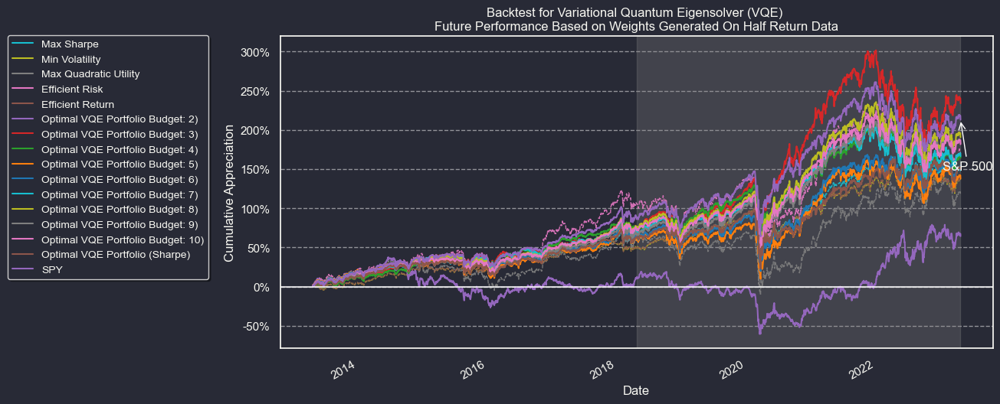

In [ ]:

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
colors = list(mcolors.TABLEAU_COLORS)[::-1]

plt.style.use(matplotx.styles.dracula)
fig, ax = plt.subplots(figsize=(12, 6))
strategies_with_quantum_past.plot(ax=ax, title='Backtest for Variational Quantum Eigensolver (VQE) \nFuture Performance Based on Weights Generated On Half Return Data', color=colors)
ax.set_ylabel('Cumulative Appreciation')
ax.set_xlabel('Date')
ax.legend(loc='upper left', ncol = 1, shadow=True, fancybox=True, bbox_to_anchor=(-.39, 1.02), fontsize=10)

ax.yaxis.set_major_formatter('{x:.0%}')

for i in range(0,5):
    ax.lines[i].set_linewidth(1)
    ax.lines[i].set_alpha(.9)
    ax.lines[i].set_linestyle('dashed')
    

x_coord = benchmark_plot.index[-1]
y_coord = benchmark_plot.iloc[-1, 0]

text_x = 1
text_y = y_coord - 0.2

arrow_props = dict(arrowstyle='->', facecolor='red', edgecolor='white',
                   linewidth=1, alpha=1, mutation_scale=15)

ax.annotate('S&P 500',
            xy=(x_coord, y_coord),
            xytext=(text_x, .6),
            xycoords='data',
            textcoords='axes fraction',
            arrowprops=arrow_props,
            horizontalalignment='right',
            verticalalignment='top',
            fontsize=12)

ax.axhline(y=0, color='white', linestyle='-', alpha=0.8)
ax.grid(which='major', axis='y', linestyle='--', c = 'white', alpha = 0.5)

ax.xaxis.grid(False)
ax.yaxis.grid(True)

future_start, future_end = future_returns.index[0], future_returns.index[-1]
ax.axvspan(future_start, future_end, alpha=0.3, color='gray')


plt.show()

# QAOA #

Optimal: selection [0. 1. 1. 1. 1. 1. 1. 0. 1. 1.], value -0.0056
---------------------------------------------------
Selected stocks:
XLP
XLE
XLF
XLV
XLI
XLB
XLK
XLU

----------------- Full result ---------------------
selection	value		probability
---------------------------------------------------
[1 1 1 1 1 1 1 1 1 1]	0.4613		0.1680
[0 0 0 0 0 0 0 0 0 0]	0.0000		0.0322
[1 1 1 1 1 1 1 1 1 0]	0.3330		0.0186
[0 1 1 1 1 1 1 1 1 1]	0.2089		0.0176
[1 1 1 1 1 1 1 1 0 1]	0.2318		0.0156
[1 1 1 1 1 1 1 0 1 1]	0.1789		0.0156
[1 1 1 1 1 1 0 1 1 1]	0.2463		0.0137
[1 1 1 1 1 0 1 1 1 1]	0.2822		0.0137
[1 1 0 1 1 1 1 1 1 1]	0.3074		0.0127
[1 1 1 0 1 1 1 1 1 1]	0.2689		0.0127
[1 1 1 1 0 1 1 1 1 1]	0.3595		0.0098
[1 0 1 0 1 1 1 1 0 1]	0.0244		0.0088
[1 1 1 1 1 1 0 0 1 1]	0.0111		0.0059
[1 1 1 1 0 1 1 1 1 0]	0.2512		0.0059
[1 0 1 1 0 0 1 1 1 1]	0.1414		0.0049
[1 1 1 1 0 1 0 1 1 0]	0.0819		0.0049
[1 0 0 1 0 1 1 1 1 1]	0.1606		0.0049
[1 0 1 0 1 1 0 0 1 0]	-0.1691		0.0039
[1 1 1 1 0 1 1 0 1 0]	0.0174		0.

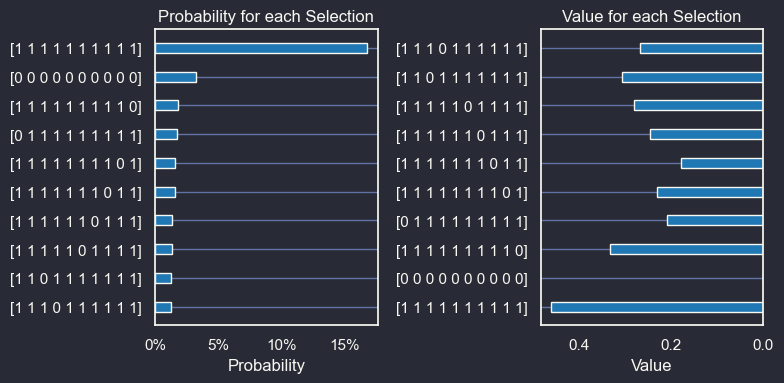

In [ ]:
seed = 123


q = 0.5  # set risk factor
budget = num_assets - 2 # set budget
penalty = num_assets  # set parameter to scale the budget penalty term


portfolio = PortfolioOptimization(
    expected_returns=returns_array, covariances=cov_matrix_array, risk_factor=q, budget=budget
)


qp = portfolio.to_quadratic_program()
qp

algorithm_globals.random_seed = 1234

cobyla = COBYLA()
cobyla.set_options(maxiter=MAX_ITER)
qaoa_mes = QAOA(sampler=Sampler(), optimizer=cobyla, reps=3)
qaoa = MinimumEigenOptimizer(qaoa_mes)
result_qaoa = qaoa.solve(qp)

print_result(result_qaoa)

In [ ]:
Portfolios_DF_QAOA = pd.DataFrame(columns=['Portfolios', 'Returns', 'Std', 'Sharpe'])

for q in np.linspace(0.1, 1.0, num = 10):
    for budget in range(2, len(stocks)+1):
        portfolio = PortfolioOptimization(
            expected_returns=returns_array, covariances=cov_matrix_array, risk_factor=q, budget=budget
        )
        qp = portfolio.to_quadratic_program()

        cobyla = COBYLA()
        cobyla.set_options(maxiter=MAX_ITER)
        qaoa_mes = QAOA(sampler=Sampler(), optimizer=cobyla, reps=3)
        qaoa = MinimumEigenOptimizer(qaoa_mes)
        result_qaoa = qaoa.solve(qp)


        port = get_port(result_qaoa)
        probs = get_prob(result_qaoa)
        weight_port = weighted_portfolios(port)
        portfolio_str = portfolios_string(port)
        returns_quant = quantum_portfolio_returns(weight_port, returns_array)
        std_quant = quantum_portfolio_std(weight_port, cov_matrix_array)
        sharpe_test = quantum_portfolio_sharpe(weight_port, returns_array, cov_matrix_array)
        df_quantum_portfolios = quant_df(portfolio_str, returns_quant, std_quant, sharpe_test, probs)
        df_quantum_portfolios['Budget'] = budget
        df_quantum_portfolios['Risk Factor'] = q
        Portfolios_DF_QAOA = pd.concat([Portfolios_DF_QAOA, df_quantum_portfolios], ignore_index=True)


In [ ]:
Portfolios_DF_QAOA = Portfolios_DF_QAOA.sort_values(by=['Sharpe'], ascending=False)
Portfolios_DF_QAOA = Portfolios_DF_QAOA.dropna()
Portfolios_DF_QAOA = Portfolios_DF_QAOA.drop_duplicates(subset=['Portfolios'])
Portfolios_DF_QAOA

,Portfolios,Returns,Std,Sharpe,Probability,Budget,Risk Factor
22887,[0 0 0 0 1 1 0 0 0 0],0.112537,0.156778,0.590244,0.002930,3.0,0.7
26901,[0 1 0 1 1 1 0 0 0 0],0.110040,0.154957,0.581061,0.002930,4.0,0.8
11643,[0 1 0 0 1 1 0 0 0 0],0.103249,0.143723,0.579234,0.010742,3.0,0.4
21555,[0 0 0 1 1 1 0 0 0 0],0.118495,0.170233,0.578588,0.000977,7.0,0.6
5693,[0 1 1 1 1 1 0 0 1 0],0.118606,0.170507,0.578310,0.001953,6.0,0.2
...,...,...,...,...,...,...,...
31517,[1 0 0 0 0 0 0 1 0 0],0.127563,0.273339,0.393516,0.000977,5.0,0.9
29758,[0 0 1 0 0 0 0 0 0 0],0.131451,0.302238,0.368751,0.016602,2.0,0.9
21309,[0 0 0 0 0 0 0 1 0 0],0.127454,0.301958,0.355857,0.008789,6.0,0.6
26194,[0 0 0 0 0 0 0 0 0 1],0.084342,0.198491,0.324154,0.046875,2.0,0.8


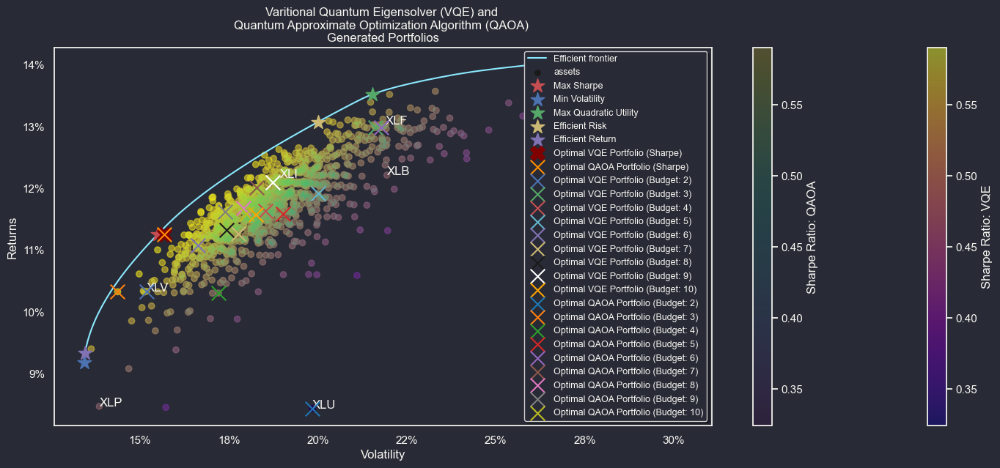

In [ ]:
ef = EfficientFrontier(returns, cov_matrix, weight_bounds=(0, 1))

import matplotx
plt.style.use(matplotx.styles.dracula)


fig, ax = plt.subplots(figsize=(15, 6))
plotting.plot_efficient_frontier(ef, ax=ax, show_tickers=True)



ret_tangent, std_tangent, _ = ef_max_sharpe.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="r", label="Max Sharpe", zorder=3)


ret_tangent, std_tangent, _ = ef_min_vol.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="b", label="Min Volatility", zorder=3)


ret_tangent, std_tangent, _ = ef_max_quad_util.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="g", label="Max Quadratic Utility", zorder=3)


ret_tangent, std_tangent, _ = ef_efficient_risk.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="y", label="Efficient Risk", zorder=3)


ret_tangent, std_tangent, _ = ef_efficient_return.portfolio_performance()
ax.scatter(std_tangent, ret_tangent, marker="*", s=200, c="m", label="Efficient Return", zorder=3)




sc = ax.scatter(Portfolios_DF['Std'], Portfolios_DF['Returns'], c=Portfolios_DF['Sharpe'], cmap='plasma', alpha=0.5)
sc2 = ax.scatter(Portfolios_DF_QAOA['Std'], Portfolios_DF_QAOA['Returns'], c=Portfolios_DF_QAOA['Sharpe'], cmap='viridis', alpha=0.2)

ax.set_xlabel('Volatility')
ax.set_ylabel('Returns')
ax.set_title('Varitional Quantum Eigensolver (VQE) and \nQuantum Approximate Optimization Algorithm (QAOA) \nGenerated Portfolios')
cbar = plt.colorbar(sc, ax=ax)
cbar.set_label('Sharpe Ratio: VQE')

cbar2 = plt.colorbar(sc2, ax=ax)
cbar2.set_label('Sharpe Ratio: QAOA')



ax.scatter(Portfolios_DF['Std'][Portfolios_DF['Sharpe'].idxmax()],
        Portfolios_DF['Returns'][Portfolios_DF['Sharpe'].idxmax()],
        marker="X", color='maroon', s=200, label='Optimal VQE Portfolio (Sharpe)', alpha=1, zorder=3)

ax.scatter(Portfolios_DF_QAOA['Std'][Portfolios_DF_QAOA['Sharpe'].idxmax()],
        Portfolios_DF_QAOA['Returns'][Portfolios_DF_QAOA['Sharpe'].idxmax()],
        marker="x", color='darkorange', s=200, label='Optimal QAOA Portfolio (Sharpe)', alpha=1, zorder=3)

highest_prob_indices = Portfolios_DF.groupby('Budget')['Probability'].idxmax()

colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'orange']
count = 0
for idx in highest_prob_indices:
    
    ax.scatter(Portfolios_DF['Std'][idx],
               Portfolios_DF['Returns'][idx],
               marker="x", color=colors[count], s=200, label=f'Optimal VQE Portfolio (Budget: {int(Portfolios_DF["Budget"][idx])})', alpha=1, zorder=3)
    count += 1

highest_prob_indices_QAOA = Portfolios_DF_QAOA.groupby('Budget')['Probability'].idxmax()

# colors = ['b', 'g', 'r', 'c', 'm', 'y', 'k', 'w', 'orange']
tableau_colors = list(mcolors.TABLEAU_COLORS.values())
tableau_colors[:-9]
count = 0
for idx in highest_prob_indices_QAOA:
    
    ax.scatter(Portfolios_DF_QAOA['Std'][idx],
               Portfolios_DF_QAOA['Returns'][idx],
               marker="x", color=tableau_colors[count], s=200, label=f'Optimal QAOA Portfolio (Budget: {int(Portfolios_DF_QAOA["Budget"][idx])})', alpha=1, zorder=3)
    count += 1


ax.xaxis.set_major_formatter('{x:.0%}')
ax.yaxis.set_major_formatter('{x:.0%}')

ax.xaxis.grid(False)
ax.yaxis.grid(False)

ax.legend(loc = 'lower right', fancybox=True, shadow=True,fontsize =9 )
plt.show()


In [ ]:
backend_quantum = least_busy(provider.backends(filters=lambda x: not x.configuration().simulator))
print("Least busy backend: ", backend_quantum)
print('Status: ', backend_quantum.status().pending_jobs)
print('Status message: ',backend_quantum.status().status_msg)
print('Number of qubits: ', backend_quantum.configuration().n_qubits)
print('NOTE: Can only have as many stocks as qubits available')
print(f'We will reduce stock size to {backend_quantum.configuration().n_qubits} stocks')
print(f'Stocks used: {stocks[:backend_quantum.configuration().n_qubits]}')

Least busy backend:  ibmq_lima
Status:  40
Status message:  active
Number of qubits:  5
NOTE: Can only have as many stocks as qubits available
We will reduce stock size to 5 stocks
Stocks used: ['XLY', 'XLP', 'XLE', 'XLF', 'XLV']


In [ ]:
from qiskit.utils import QuantumInstance
quantum_instance = QuantumInstance(backend=backend_quantum, shots=1024, seed_transpiler=42)

In [ ]:
stocks_quantum = stocks[:backend_quantum.configuration().n_qubits]
stocks_quantum

quantum_data = get_adj_close_df(stocks_quantum, start_date, end_date)
quantum_data.head()

100%|██████████| 5/5 [00:02<00:00,  1.78it/s]


,XLY,XLP,XLE,XLF,XLV
Date,,,,,
2013-04-22,47.244435,31.611784,51.478403,12.124260,40.720925
2013-04-23,47.721562,31.857850,52.072699,12.341961,40.976015
2013-04-24,47.756905,31.350339,52.769461,12.418994,40.270265
2013-04-25,48.163346,31.450303,52.810447,12.492677,40.431823
2013-04-26,47.951290,31.442614,52.721644,12.435740,40.419068


In [ ]:
return_quantum_array = np.array(expected_returns.capm_return(quantum_data, df_benchmark))
cov_exp_quantum_array = np.array(exp_cov(quantum_data))

In [ ]:
return_quantum_array.shape,cov_exp_quantum_array.shape

((5,), (5, 5))

In [ ]:
from qiskit.algorithms import VQE

data_quantum = AlphaVantageDataProvider(stocks_quantum , date_range_slider.value[0], date_range_slider.value[1])
data_quantum.run()

num_assets = len(stocks_quantum)
seed = 123


q = 0.5  # set risk factor
budget = num_assets - 2 # set budget
penalty = num_assets  # set parameter to scale the budget penalty term

portfolio = PortfolioOptimization(
    expected_returns=return_quantum_array, covariances=cov_exp_quantum_array, risk_factor=q, budget=budget
)

qp = portfolio.to_quadratic_program()
qp


algorithm_globals.random_seed = 1234

cobyla = COBYLA()
cobyla.set_options(maxiter=2)
ry = TwoLocal(num_assets, "ry", "cz", reps=3, entanglement="full")
vqe_mes = VQE(ansatz=ry, optimizer=cobyla, quantum_instance=quantum_instance)
vqe = MinimumEigenOptimizer(vqe_mes)
result = vqe.solve(qp)
print(result)

100%|██████████| 5/5 [00:02<00:00,  1.89it/s]


KeyboardInterrupt: 

## Example with 3 assets and a budget of 2 assets

Consider a simple example with three assets (n = 3) and a budget of two assets to be selected (B = 2). The risk appetite (q) is set to 1 for simplicity.

1. Expected returns ($\mu$):
   - Asset 1: 5%
   - Asset 2: 7%
   - Asset 3: 9%
   - $\mu = \begin{bmatrix} 0.05 \\ 0.07 \\ 0.09 \end{bmatrix}$

2. Covariance matrix ($\Sigma$):
   - $\Sigma = \begin{bmatrix} 0.04 & 0.006 & -0.002 \\ 0.006 & 0.09 & 0.03 \\ -0.002 & 0.03 & 0.16 \end{bmatrix}$

3. Risk appetite (q): 1

The optimization problem becomes:

$$\begin{aligned}
\min_{x \in \{0, 1\}^3} x^T \begin{bmatrix} 0.04 & 0.006 & -0.002 \\ 0.006 & 0.09 & 0.03 \\ -0.002 & 0.03 & 0.16 \end{bmatrix} x - \begin{bmatrix} 0.05 \\ 0.07 \\ 0.09 \end{bmatrix}^T x\\
\text{subject to: } 1^T x = 2
\end{aligned}$$

The possible portfolio selections are:

1. Select assets 1 and 2: $x = \begin{bmatrix} 1 \\ 1 \\ 0 \end{bmatrix}$
2. Select assets 1 and 3: $x = \begin{bmatrix} 1 \\ 0 \\ 1 \end{bmatrix}$
3. Select assets 2 and 3: $x = \begin{bmatrix} 0 \\ 1 \\ 1 \end{bmatrix}$

Now, we'll evaluate the objective function for each selection:

1. $x^T \Sigma x - \mu^T x = \begin{bmatrix} 1 & 1 & 0 \end{bmatrix} \begin{bmatrix} 0.04 & 0.006 & -0.002 \\ 0.006 & 0.09 & 0.03 \\ -0.002 & 0.03 & 0.16 \end{bmatrix} \begin{bmatrix} 1 \\ 1 \\ 0 \end{bmatrix} - \begin{bmatrix} 0.05 & 0.07 & 0.09 \end{bmatrix} \begin{bmatrix} 1 \\ 1 \\ 0 \end{bmatrix} = 0.052$

2. $x^T \Sigma x - \mu^T x = \begin{bmatrix} 1 & 0 & 1 \end{bmatrix} \begin{bmatrix} 0.04 & 0.006 & -0.002 \\ 0.006 & 0.09 & 0.03 \\ -0.002 & 0.03 & 0.16 \end{bmatrix} \begin{bmatrix} 1 \\ 0 \\ 1 \end{bmatrix} - \begin{bmatrix} 0.05 & 0.07 & 0.09 \end{bmatrix} \begin{bmatrix} 1 \\ 0 \\ 1 \end{bmatrix} = 0.038$

3. $x^T \Sigma x - \mu^T x = \begin{bmatrix} 0 & 1 & 1 \end{bmatrix} \begin{bmatrix} 0.04 & 0.006 & -0.002 \\ 0.006 & 0.09 & 0.03 \\ -0.002 & 0.03 & 0.16 \end{bmatrix} \begin{bmatrix} 0 \\ 1 \\ 1 \end{bmatrix} - \begin{bmatrix} 0.05 & 0.07 & 0.09 \end{bmatrix} \begin{bmatrix} 0 \\ 1 \\ 1 \end{bmatrix} = 0.123$

Now, let's compare the objective function values for each selection:

1. Select assets 1 and 2: Objective function value = 0.052
2. Select assets 1 and 3: Objective function value = 0.038
3. Select assets 2 and 3: Objective function value = 0.123

The selection with the lowest objective function value is the one with assets 1 and 3 (value = 0.038). This means that, given the risk appetite and budget constraint, the optimal portfolio consists of assets 1 and 3.

Given:

1. Expected returns ($\mu$):
   - $\mu = \begin{bmatrix} 0.05 \\ 0.07 \\ 0.09 \end{bmatrix}$

2. Covariance matrix ($\Sigma$):
   - $\Sigma = \begin{bmatrix} 0.04 & 0.006 & -0.002 \\ 0.006 & 0.09 & 0.03 \\ -0.002 & 0.03 & 0.16 \end{bmatrix}$

For selection 1 (assets 1 and 2), the decision vector is $x = \begin{bmatrix} 1 \\ 1 \\ 0 \end{bmatrix}$.

Now, let's calculate the objective function value:

$x^T \Sigma x - \mu^T x = \begin{bmatrix} 1 & 1 & 0 \end{bmatrix} \begin{bmatrix} 0.04 & 0.006 & -0.002 \\ 0.006 & 0.09 & 0.03 \\ -0.002 & 0.03 & 0.16 \end{bmatrix} \begin{bmatrix} 1 \\ 1 \\ 0 \end{bmatrix} - \begin{bmatrix} 0.05 & 0.07 & 0.09 \end{bmatrix} \begin{bmatrix} 1 \\ 1 \\ 0 \end{bmatrix}$

First, calculate the product $x^T \Sigma$:

$\begin{bmatrix} 1 & 1 & 0 \end{bmatrix} \begin{bmatrix} 0.04 & 0.006 & -0.002 \\ 0.006 & 0.09 & 0.03 \\ -0.002 & 0.03 & 0.16 \end{bmatrix} = \begin{bmatrix} 0.046 & 0.096 & 0.028 \end{bmatrix}$

Next, calculate the product $x^T \Sigma x$:

$\begin{bmatrix} 0.046 & 0.096 & 0.028 \end{bmatrix} \begin{bmatrix} 1 \\ 1 \\ 0 \end{bmatrix} = 0.142$

Then, calculate the product $\mu^T x$:

$\begin{bmatrix} 0.05 & 0.07 & 0.09 \end{bmatrix} \begin{bmatrix} 1 \\ 1 \\ 0 \end{bmatrix} = 0.12$

Finally, subtract $\mu^T x$ (he risk-adjusted portolio Variance) from $x^T \Sigma x$ (total expected return of portfolio):

$0.142 - 0.12 = 0.022$

So, the objective function value for selection 1 (assets 1 and 2) is 0.022.

In the context of the portfolio optimization problem, subtracting the expected return of the portfolio ($\mu^T x$) from the risk-adjusted portfolio variance ($q x^T \Sigma x$) is a way of finding the optimal balance between risk and return.

The objective function we are trying to minimize is:

$$f(x) = q x^T \Sigma x - \mu^T x$$

Here's the intuition behind subtracting the expected return ($\mu^T x$):

1. **Risk-adjusted portfolio variance ($q x^T \Sigma x$)**: This term represents the total risk associated with the portfolio, adjusted by the investor's risk preference (controlled by the risk factor $q$). The goal is to minimize the risk in the portfolio. A higher value for this term means higher risk.

2. **Expected return of the portfolio ($\mu^T x$)**: This term represents the total expected return of the portfolio. The goal is to maximize the return on the portfolio. A higher value for this term means higher expected return.

By subtracting the expected return from the risk-adjusted portfolio variance, the objective function balances the trade-off between risk and return:

- Minimizing the risk-adjusted variance means finding a portfolio with a lower overall risk, which is desirable for most investors.
- Maximizing the expected return means finding a portfolio that yields higher returns, which is also desirable for most investors.

As a result, the objective function tries to find the portfolio allocation that minimizes the risk while maximizing the return, achieving the optimal balance between risk and return for the investor.
